In [2]:
import numpy as np
from problems.QP_with_Lasso import QP_with_Lasso
from problems.square_root_Lasso import Square_Root_Lasso
from problems.sparse_logistic_regression import Sparse_Logistic_Regression
from problems.random_large_QP import Random_Large_QP

import matplotlib.pyplot as plt
import pandas as pd

from first_order_methods import First_Order_Methods
from libsvmdata import fetch_libsvm
import pickle

/Users/litianjiao/opt/anaconda3/lib/python3.7/site-packages/sklearn/feature_extraction/image.py:167: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype=np.int):


# Quadratic programming

AC-FGM: k=10000, alpha=0.000, beta=0.184
Number of calls used for the initial linesearch: 5
Done: 92.331 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Number of calls used for the initial linesearch: 5
Done: 92.786 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Number of calls used for the initial linesearch: 5
Done: 91.901 seconds
-----------------------------------
AdaGD: k=10000
Number of calls used for the initial linesearch: 4
Done: 93.774 seconds
-----------------------------------
NS-FGM: k=10000
Done: 354.643 seconds
-----------------------------------
FISTA: k=10000
Done: 205.045 seconds
-----------------------------------


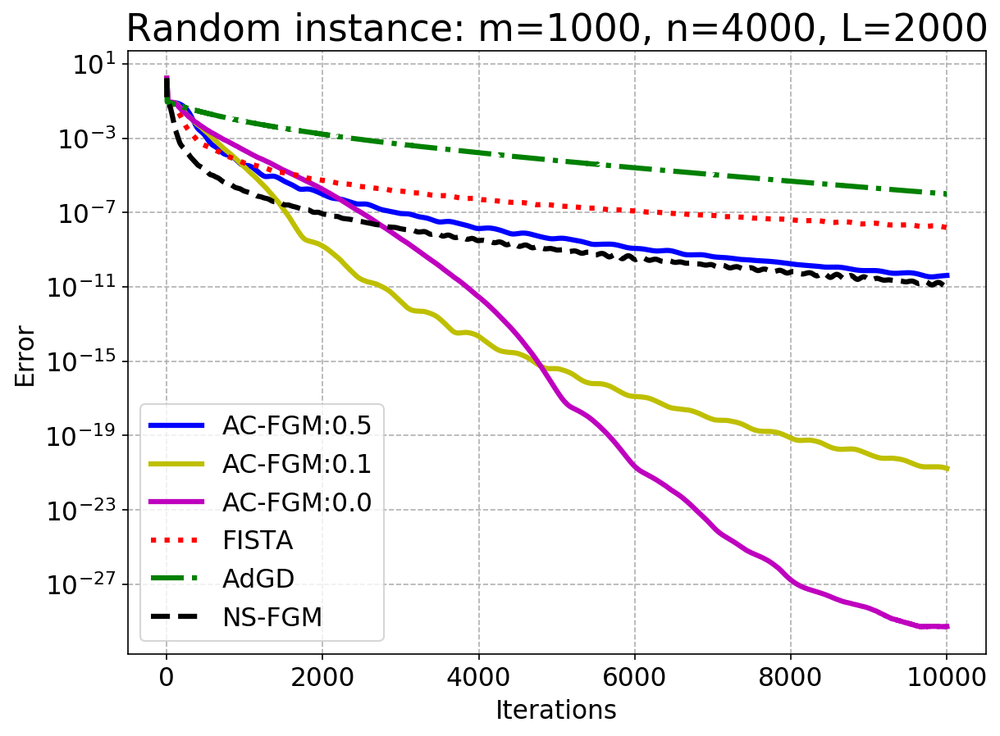

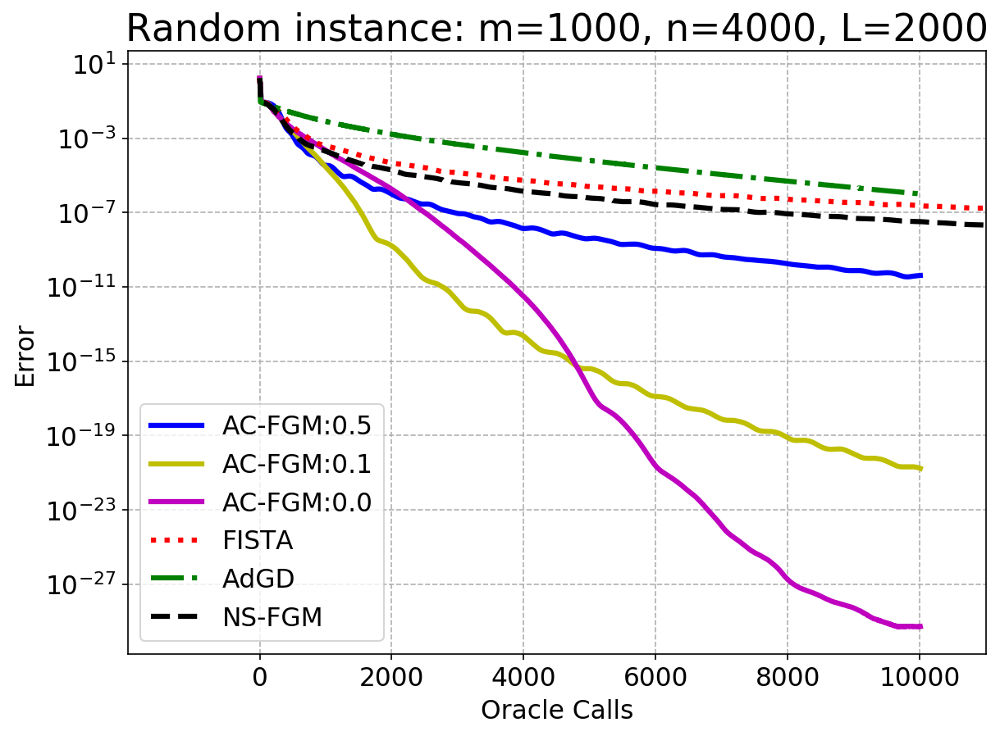

In [2]:
rlq = Random_Large_QP(m=1000, n=4000, seed=33)
rlq.gamma = 0
fom = First_Order_Methods(rlq)
result1 = fom.test_all_methods_smooth(k=10000, beta=0.184, draw_performance_plot=True, dataset="Random instance: m=1000, n=4000, L=2000", initial_line_search=True, f_star=0, right_lim=11000)

AC-FGM: k=40000, alpha=0.000, beta=0.184
Done: 2161.436 seconds
-----------------------------------
AC-FGM: k=40000, alpha=0.100, beta=0.184
Done: 2153.289 seconds
-----------------------------------
AC-FGM: k=40000, alpha=0.500, beta=0.184
Done: 2184.778 seconds
-----------------------------------
AdaGD: k=40000
Number of calls used for the initial linesearch: 4
Done: 2175.700 seconds
-----------------------------------
NS-FGM: k=40000
Done: 9752.432 seconds
-----------------------------------
FISTA: k=40000
Done: 5731.768 seconds
-----------------------------------


/Users/litianjiao/opt/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


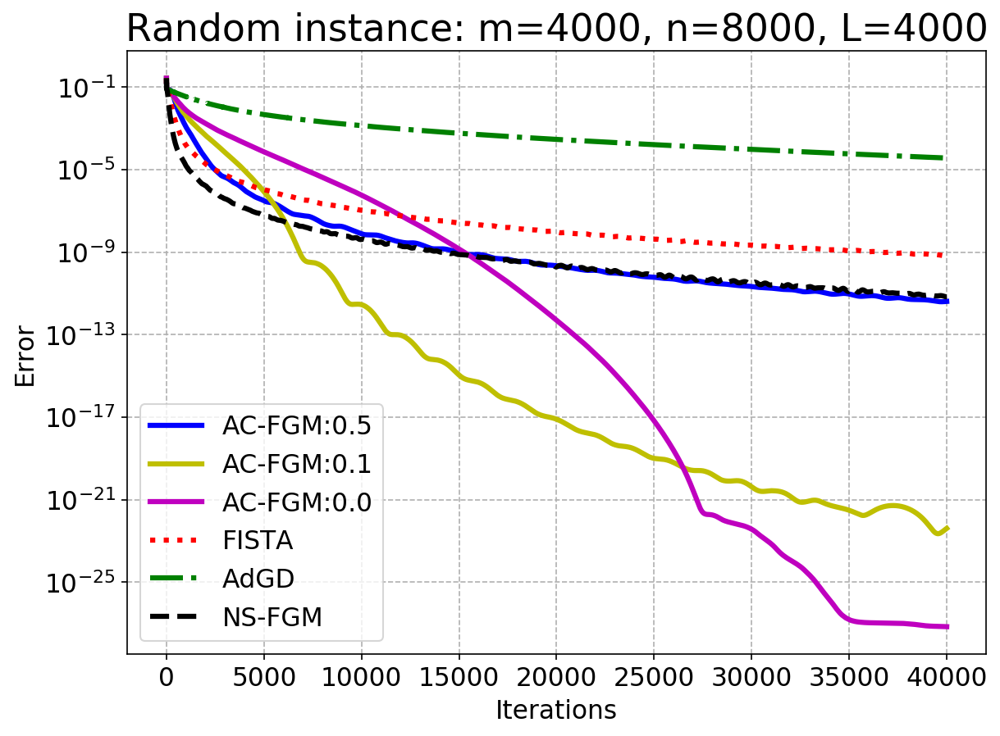

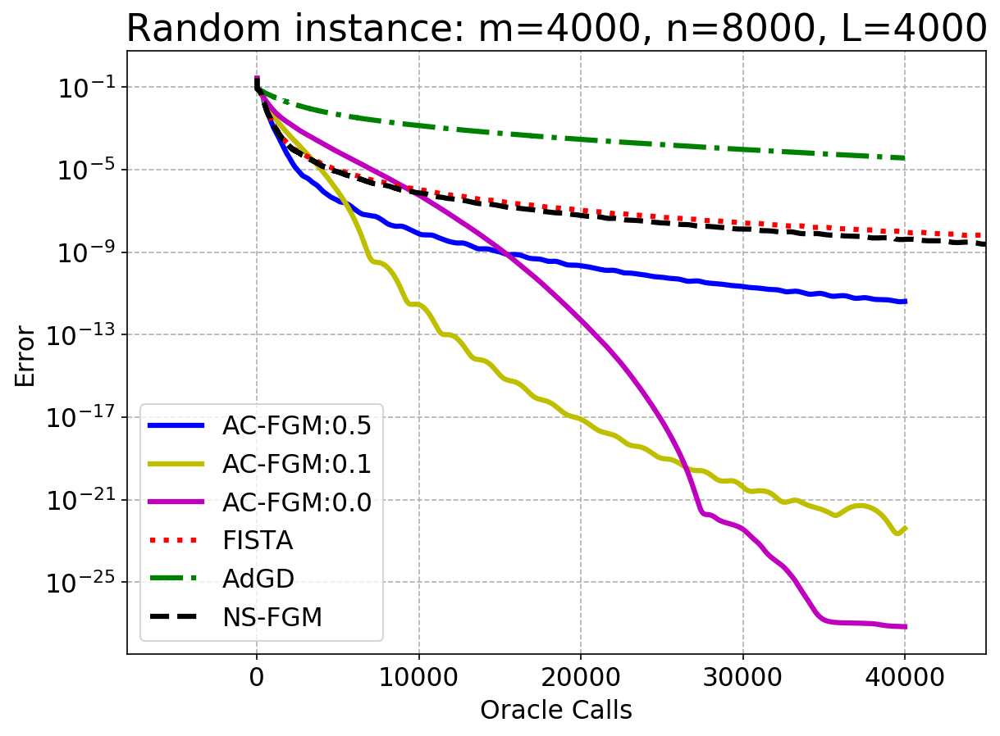

In [3]:
rlq = Random_Large_QP(m=4000, n=8000, seed=33)
rlq.gamma = 0
fom = First_Order_Methods(rlq)
result2 = fom.test_all_methods_smooth(k=40000, beta=0.184, draw_performance_plot=True, dataset="Random instance: m=4000, n=8000, L=4000", initial_line_search=False, f_star=0, right_lim=45000)

In [4]:

with open('random_QP_1.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(result1, f)

with open('random_QP_2.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(result2, f)

In [2]:
dataset = "cadata"
A_raw, b_raw = fetch_libsvm(dataset)
A = A_raw/A_raw.std()
b = b_raw/A_raw.std()
qwl = QP_with_Lasso(A, b, 0.00)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))

gamma: 0.000000
initial function value: 35298.353762


AC-FGM: k=250000, alpha=0.000, beta=0.184
Done: 393.478 seconds
-----------------------------------
AC-FGM: k=250000, alpha=0.100, beta=0.184
Done: 386.155 seconds
-----------------------------------
AC-FGM: k=250000, alpha=0.500, beta=0.184
Done: 403.946 seconds
-----------------------------------
AdaGD: k=250000
Number of calls used for the initial linesearch: 4
Done: 392.296 seconds
-----------------------------------
NS-FGM: k=250000
Done: 1342.681 seconds
-----------------------------------
FISTA: k=250000
Done: 729.276 seconds
-----------------------------------


/Users/litianjiao/opt/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


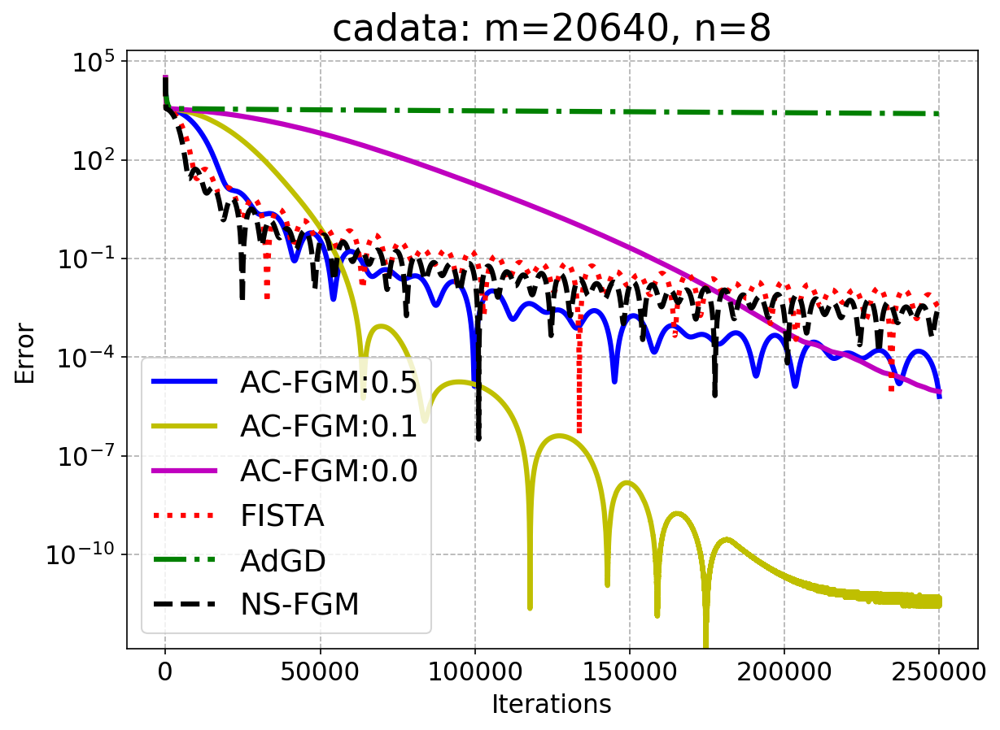

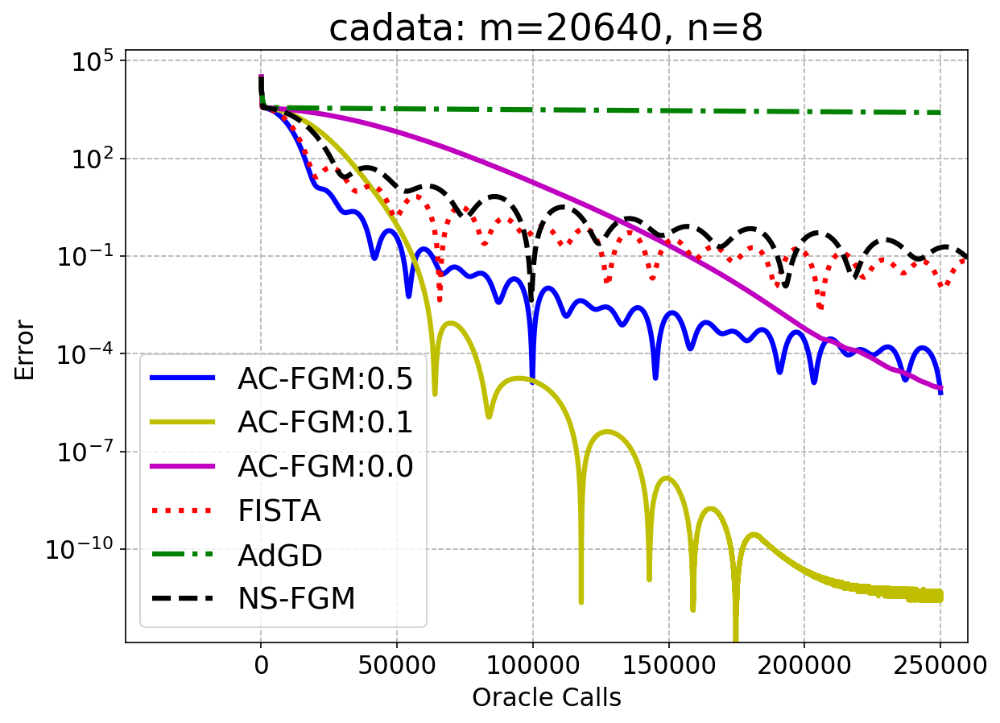

In [3]:
result_cadata = fom.test_all_methods_smooth(k=250000, beta=0.184, draw_performance_plot=True, dataset="cadata: m=20640, n=8", initial_line_search=False, right_lim=260000)
with open('QP_cadata.pkl', 'wb') as f:  
    pickle.dump(result_cadata, f)

In [3]:
dataset = "bodyfat"
A, b = fetch_libsvm(dataset)
qwl = QP_with_Lasso(A, b, 0.00)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))

gamma: 0.000000
initial function value: 1.114597


AC-FGM: k=40000, alpha=0.000, beta=0.184
Done: 2.348 seconds
-----------------------------------
AC-FGM: k=40000, alpha=0.100, beta=0.184
Done: 2.344 seconds
-----------------------------------
AC-FGM: k=40000, alpha=0.500, beta=0.184
Done: 2.390 seconds
-----------------------------------
AdaGD: k=40000
Number of calls used for the initial linesearch: 4
Done: 2.408 seconds
-----------------------------------
NS-FGM: k=40000
Done: 5.645 seconds
-----------------------------------
FISTA: k=40000
Done: 2.499 seconds
-----------------------------------


/Users/litianjiao/opt/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


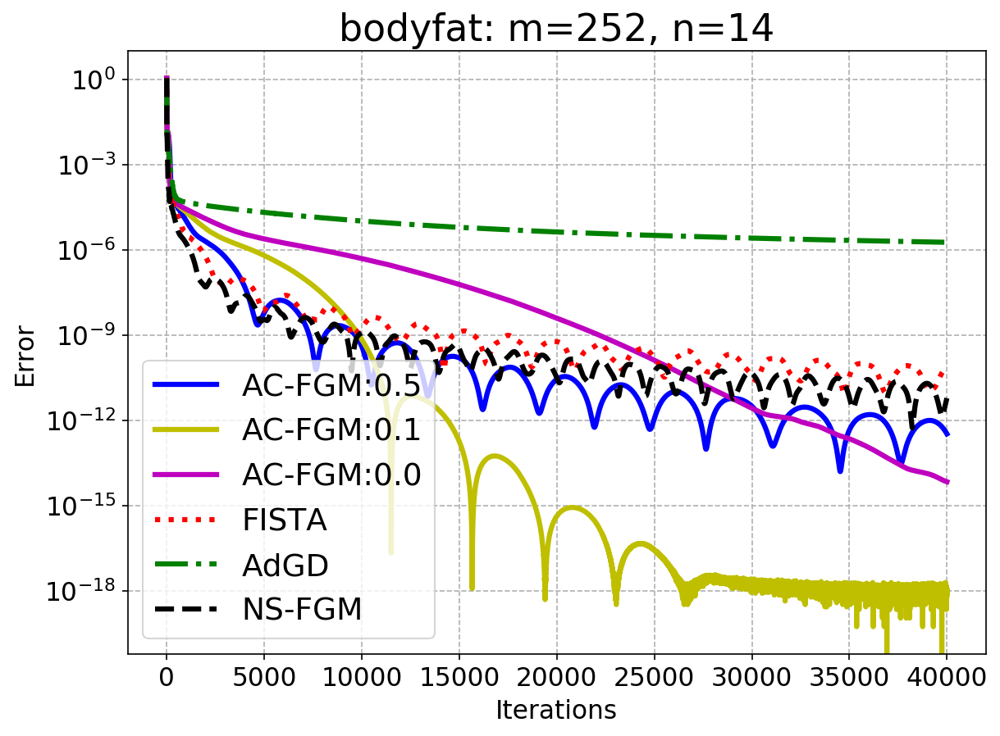

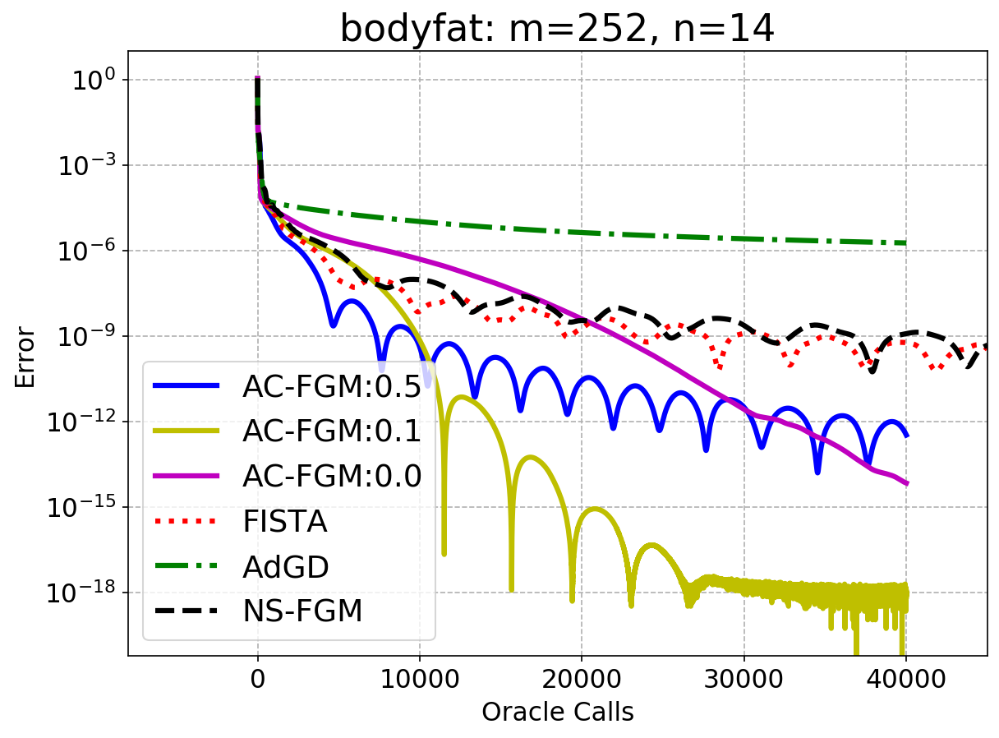

In [4]:
result_bodyfat = fom.test_all_methods_smooth(k=40000, beta=0.184, draw_performance_plot=True, dataset="bodyfat: m=252, n=14", initial_line_search=False, right_lim=45000)
with open('QP_bodyfat.pkl', 'wb') as f:  
    pickle.dump(result_bodyfat, f)

# Lasso

gamma: 0.000131
initial function value: 1.000000
------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 540.738 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 560.210 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 559.471 seconds
-----------------------------------
AdaGD: k=10000
Number of calls used for the initial linesearch: 4
Done: 555.600 seconds
-----------------------------------
NS-FGM: k=10000
Done: 1589.617 seconds
-----------------------------------
FISTA: k=10000
Done: 850.866 seconds
-----------------------------------


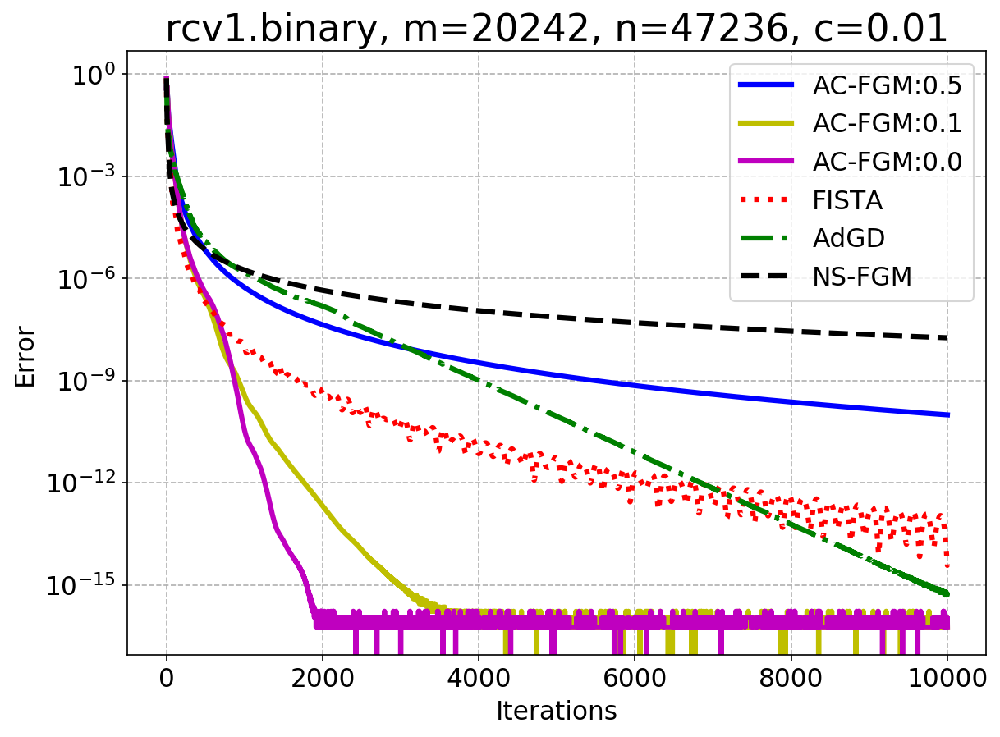

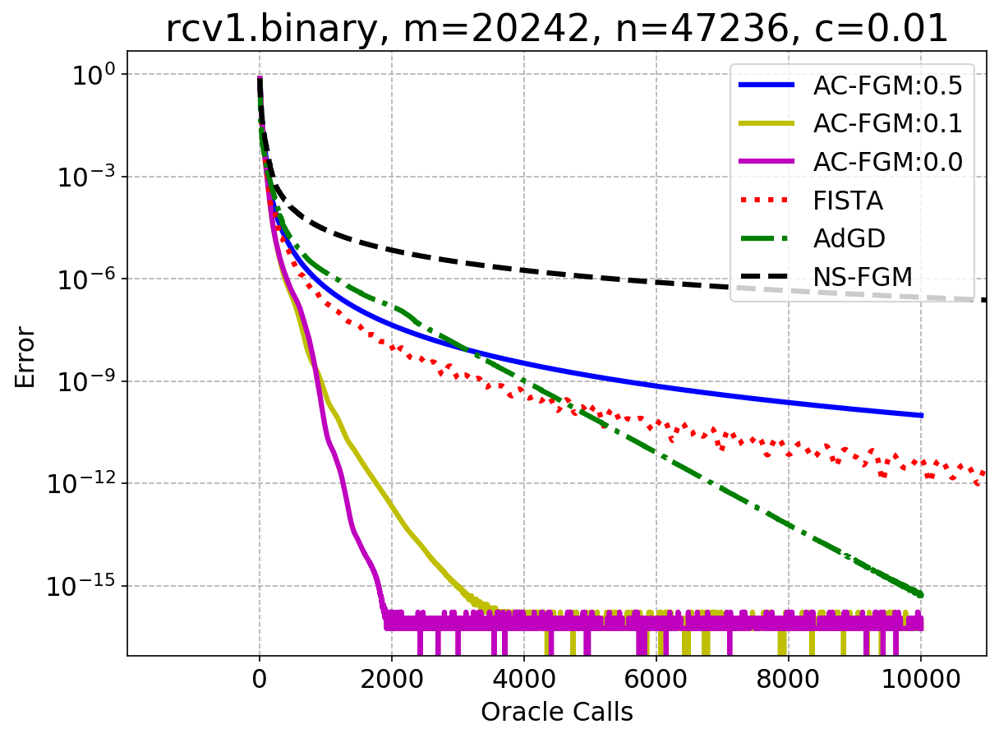

In [2]:
print("========================")
A, b = fetch_libsvm("rcv1.binary")
qwl = QP_with_Lasso(A, b, 0.01)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))
print("------------------------")
result_rcv = fom.test_all_methods_smooth(k=10000, beta=0.184, draw_performance_plot=True, dataset="rcv1.binary, m=20242, n=47236, c=0.01", initial_line_search=False, right_lim=11000)
with open('lasso_rcv_01.pkl', 'wb') as f: 
    pickle.dump(result_rcv, f)

gamma: 0.000013
initial function value: 1.000000
------------------------
AC-FGM: k=30000, alpha=0.000, beta=0.184
Done: 1703.984 seconds
-----------------------------------
AC-FGM: k=30000, alpha=0.100, beta=0.184
Done: 1670.295 seconds
-----------------------------------
AC-FGM: k=30000, alpha=0.500, beta=0.184
Done: 1538.693 seconds
-----------------------------------
AdaGD: k=30000
Number of calls used for the initial linesearch: 4
Done: 1672.926 seconds
-----------------------------------
NS-FGM: k=30000
Done: 4890.371 seconds
-----------------------------------
FISTA: k=30000
Done: 2586.589 seconds
-----------------------------------


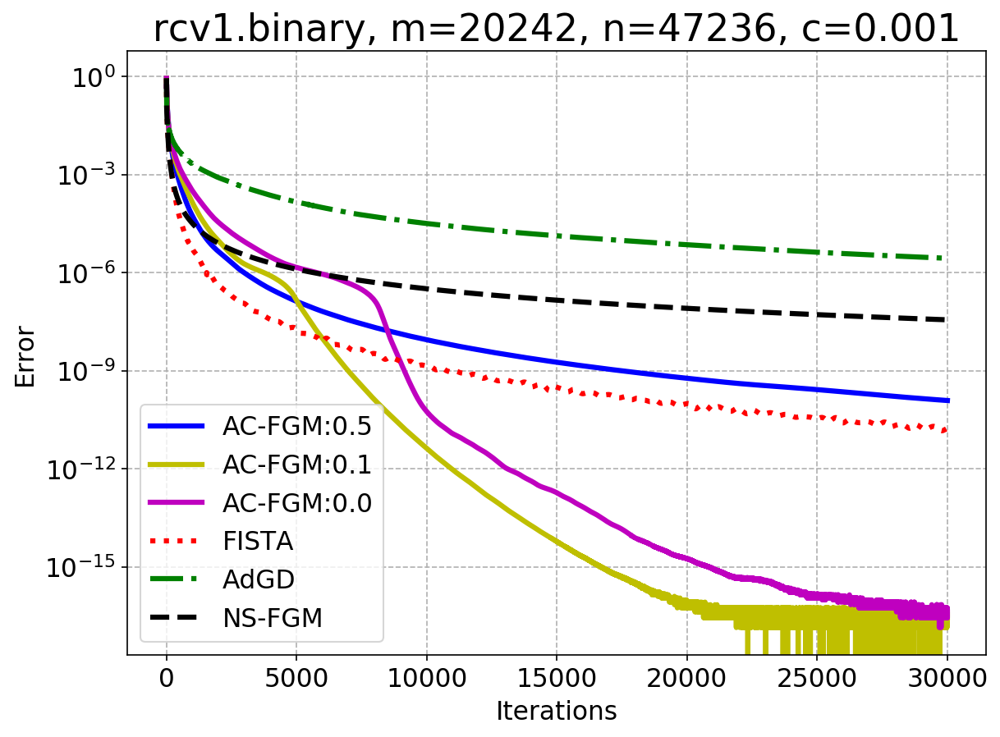

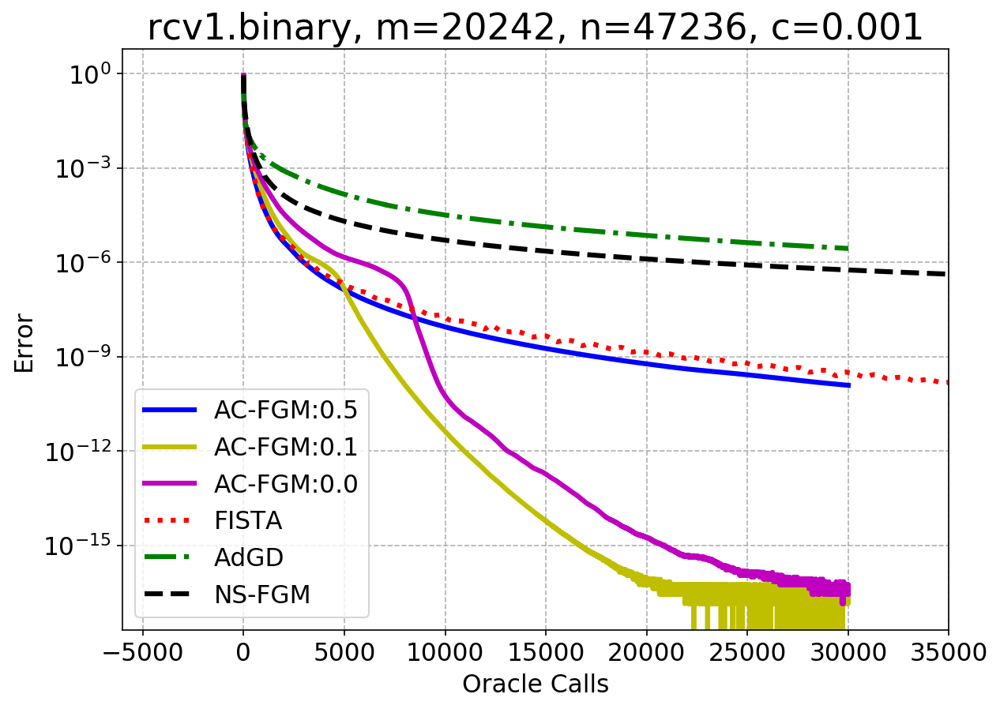

In [10]:
dataset = "rcv1.binary"
c = 0.001
k = 30000
right_lim = 35000
title = "rcv1.binary, m=20242, n=47236, c=0.001"

print("========================")
A, b = fetch_libsvm(dataset)
qwl = QP_with_Lasso(A, b, c)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))
print("------------------------")
result_rcv_2 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('lasso_rcv_001.pkl', 'wb') as f:  
    pickle.dump(result_rcv_2, f)

gamma: 0.000653
initial function value: 1.000000
------------------------
AC-FGM: k=7000, alpha=0.000, beta=0.184
Done: 388.294 seconds
-----------------------------------
AC-FGM: k=7000, alpha=0.100, beta=0.184
Done: 391.559 seconds
-----------------------------------
AC-FGM: k=7000, alpha=0.500, beta=0.184
Done: 391.027 seconds
-----------------------------------
AdaGD: k=7000
Number of calls used for the initial linesearch: 4
Done: 388.763 seconds
-----------------------------------
NS-FGM: k=7000
Done: 1130.814 seconds
-----------------------------------
FISTA: k=7000
Done: 585.463 seconds
-----------------------------------


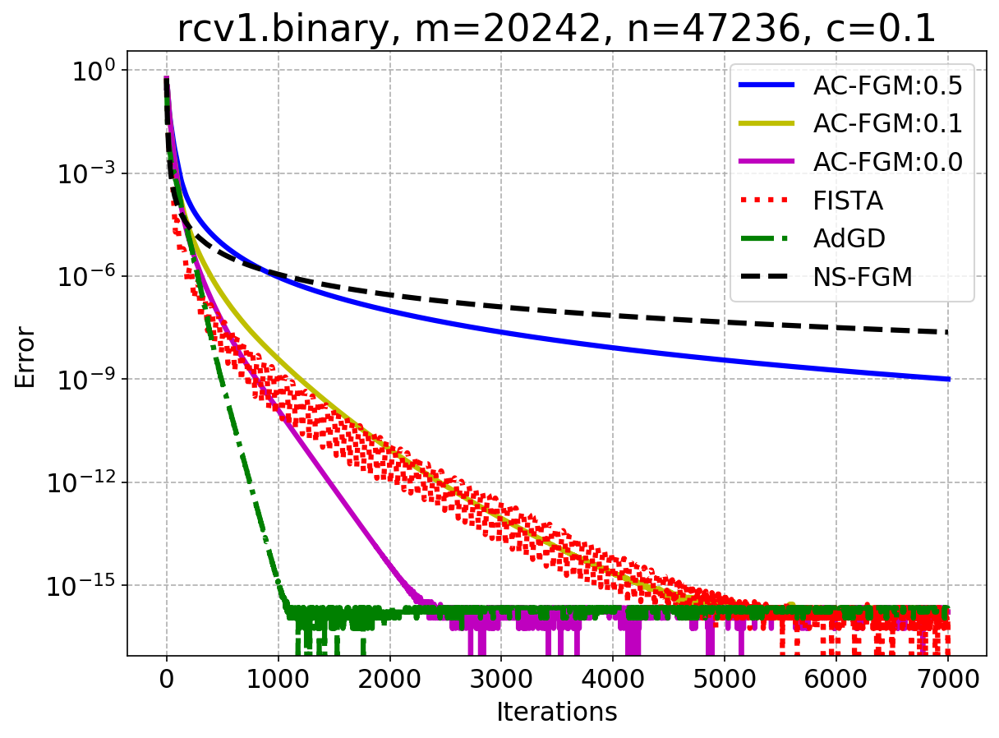

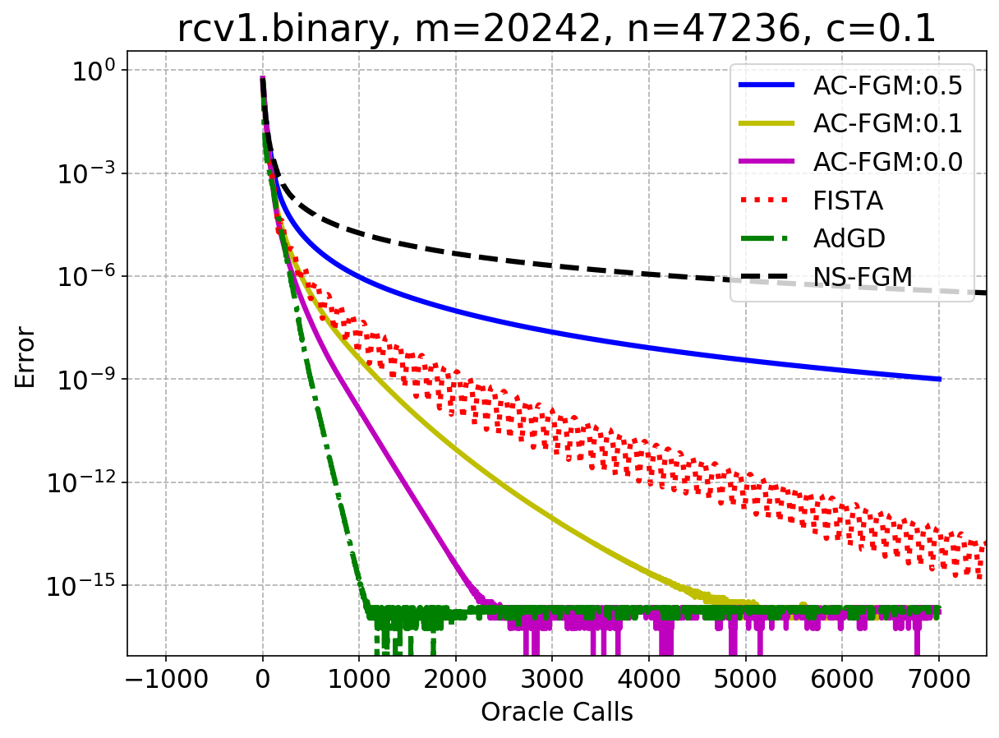

In [3]:
dataset = "rcv1.binary"
c = 0.05
k = 7000
right_lim = 7500
title = "rcv1.binary, m=20242, n=47236, c=0.1"

print("========================")
A, b = fetch_libsvm(dataset)
qwl = QP_with_Lasso(A, b, c)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))
print("------------------------")
result_rcv_3 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('lasso_rcv_05.pkl', 'wb') as f:  
    pickle.dump(result_rcv_3, f)

gamma: 0.002675
initial function value: 1.000000
------------------------
AC-FGM: k=50000, alpha=0.000, beta=0.184
Done: 2764.580 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.100, beta=0.184
Done: 2817.486 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.500, beta=0.184
Done: 2811.395 seconds
-----------------------------------
AdaGD: k=50000
Number of calls used for the initial linesearch: 1
Done: 2855.219 seconds
-----------------------------------
NS-FGM: k=50000
Done: 10401.792 seconds
-----------------------------------
FISTA: k=50000
Done: 5989.947 seconds
-----------------------------------


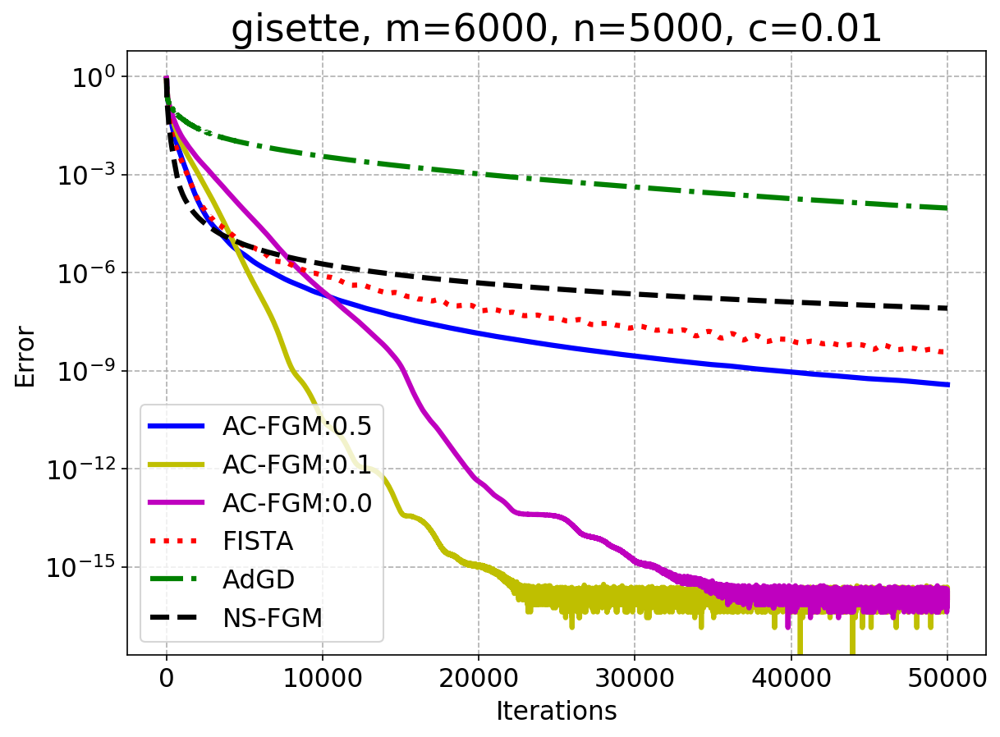

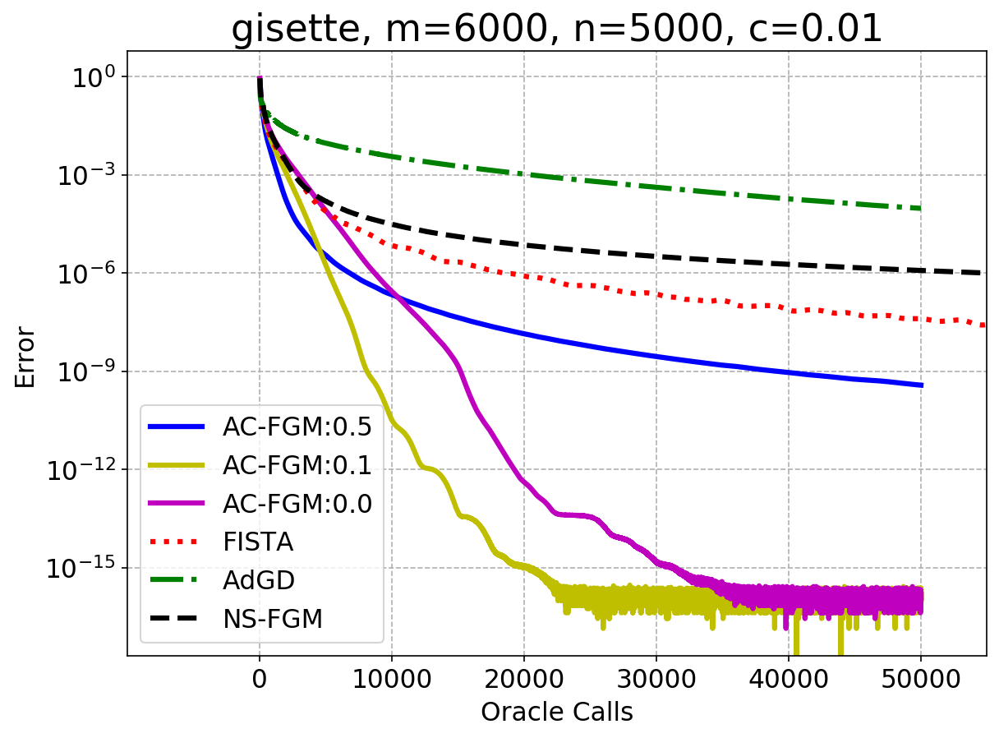

In [12]:
dataset = "gisette"
c = 0.01
k = 50000
right_lim = 55000
title = "gisette, m=6000, n=5000, c=0.01"

print("========================")
A, b = fetch_libsvm(dataset)
qwl = QP_with_Lasso(A, b, c)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))
print("------------------------")
result_gisette = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('lasso_gisette_01.pkl', 'wb') as f: 
    pickle.dump(result_gisette, f)

gamma: 0.000268
initial function value: 1.000000
------------------------
AC-FGM: k=200000, alpha=0.000, beta=0.184
Done: 10847.194 seconds
-----------------------------------
AC-FGM: k=200000, alpha=0.100, beta=0.184
Done: 10842.206 seconds
-----------------------------------
AC-FGM: k=200000, alpha=0.500, beta=0.184
Done: 11125.628 seconds
-----------------------------------
AdaGD: k=200000
Number of calls used for the initial linesearch: 1
Done: 11142.585 seconds
-----------------------------------
NS-FGM: k=200000
Done: 41430.182 seconds
-----------------------------------
FISTA: k=200000
Done: 23356.722 seconds
-----------------------------------


/Users/litianjiao/opt/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


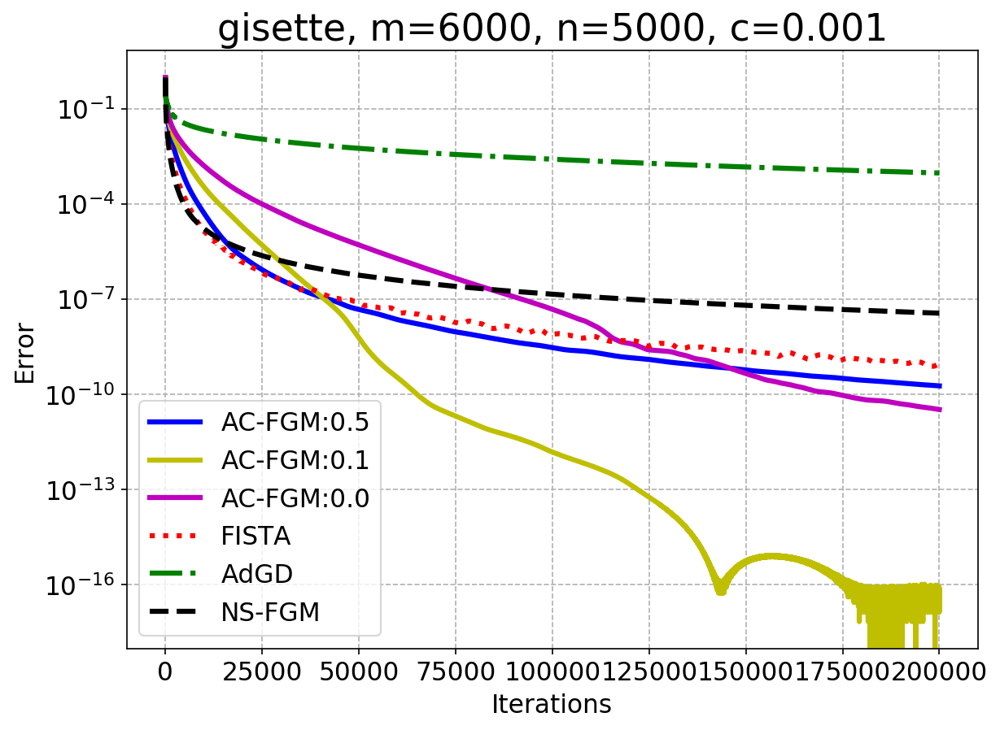

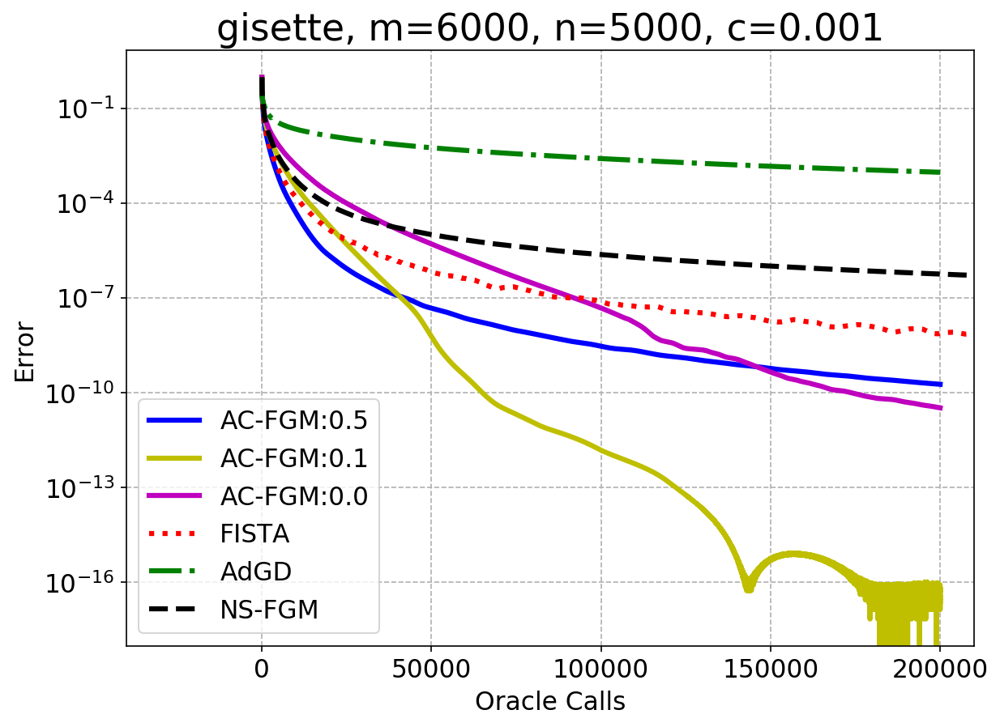

In [4]:
dataset = "gisette"
c = 0.001
k = 200000
right_lim = 210000
title = "gisette, m=6000, n=5000, c=0.001"

print("========================")
A, b = fetch_libsvm(dataset)
qwl = QP_with_Lasso(A, b, c)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))
print("------------------------")
result_gisette_2 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('lasso_gisette_001.pkl', 'wb') as f: 
    pickle.dump(result_gisette_2, f)

# square root lasso

gamma: 16.249786
initial function value: 1998.525221
------------------------
AC-FGM: k=50000, alpha=0.000, beta=0.184, eps=1e-8


Done: 723.877 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.100, beta=0.184, eps=1e-8
Done: 725.886 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.500, beta=0.184, eps=1e-8
Done: 727.750 seconds
-----------------------------------
NS-PGM: k=50000, eps=1e-8
Done: 1390.699 seconds
-----------------------------------
NS-FGM: k=50000, eps=1e-8
Done: 2372.369 seconds
-----------------------------------


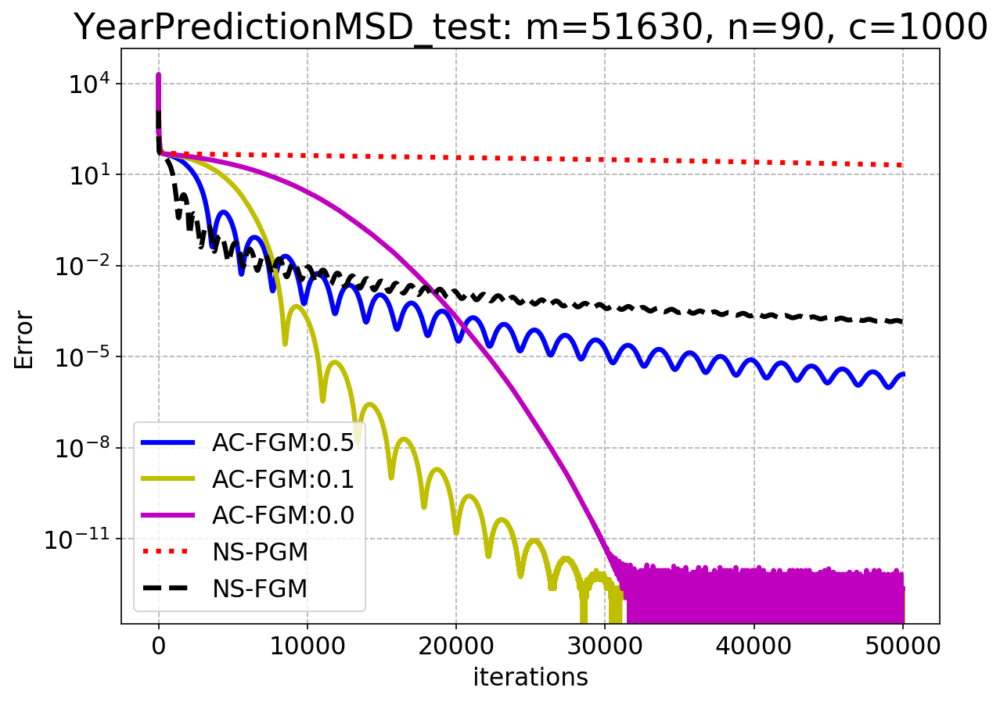

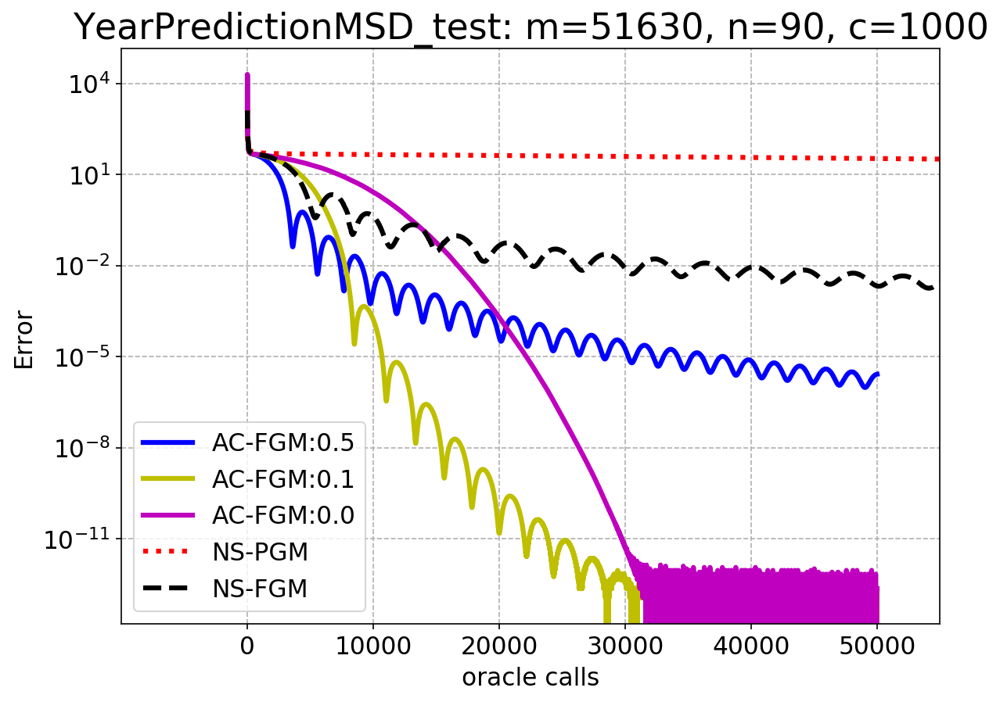

In [20]:
dataset = "YearPredictionMSD_test"
c = 1000
k = 50000
right_lim = 55000
title = "YearPredictionMSD_test: m=51630, n=90, c=1000"

print("========================")
A, b = fetch_libsvm(dataset)
srl = Square_Root_Lasso(A, b, c)
print("gamma: %f"%srl.gamma)
fom = First_Order_Methods(srl)
print("initial function value: %f"%srl.objective(fom.x_0))
print("------------------------")
result_year = fom.test_all_methods_nonsmooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('square_root_year_1000.pkl', 'wb') as f:  
    pickle.dump(result_year, f)

gamma: 1.624979
initial function value: 1998.525221
------------------------
AC-FGM: k=100000, alpha=0.000, beta=0.184, eps=1e-8


Done: 1320.834 seconds
-----------------------------------
AC-FGM: k=100000, alpha=0.100, beta=0.184, eps=1e-8
Done: 1352.011 seconds
-----------------------------------
AC-FGM: k=100000, alpha=0.500, beta=0.184, eps=1e-8
Done: 1328.344 seconds
-----------------------------------
NS-PGM: k=100000, eps=1e-8
Done: 2769.467 seconds
-----------------------------------
NS-FGM: k=100000, eps=1e-8
Done: 4976.526 seconds
-----------------------------------


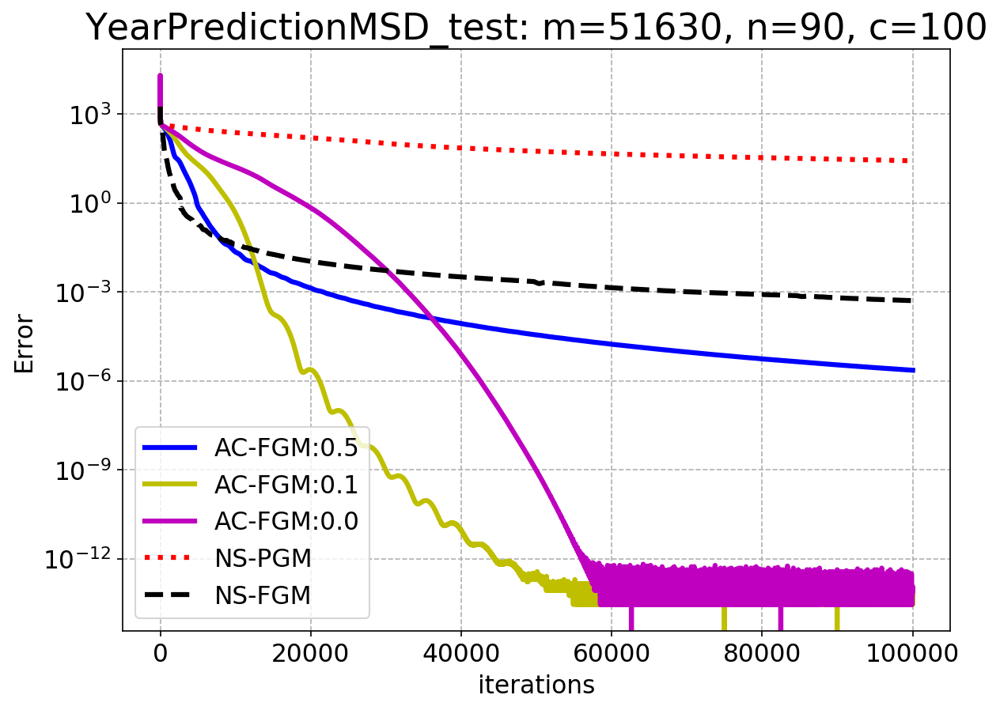

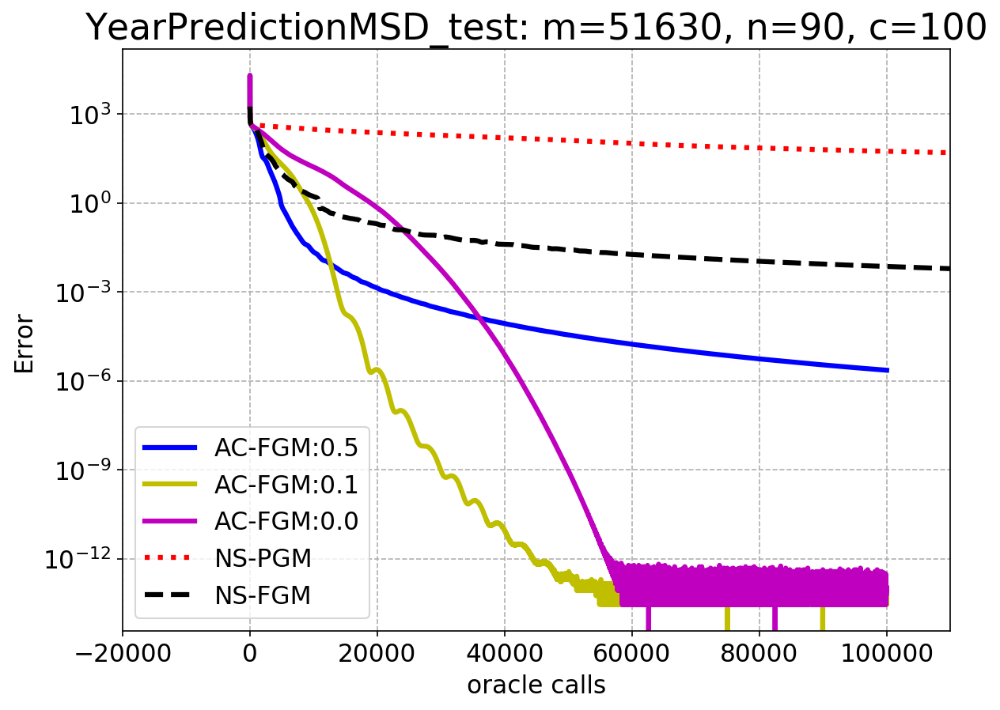

In [22]:
dataset = "YearPredictionMSD_test"
c = 100
k = 100000
right_lim = 110000
title = "YearPredictionMSD_test: m=51630, n=90, c=100"

print("========================")
A, b = fetch_libsvm(dataset)
srl = Square_Root_Lasso(A, b, c)
print("gamma: %f"%srl.gamma)
fom = First_Order_Methods(srl)
print("initial function value: %f"%srl.objective(fom.x_0))
print("------------------------")
result_year_2 = fom.test_all_methods_nonsmooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('square_root_year_100.pkl', 'wb') as f:  
    pickle.dump(result_year_2, f)

gamma: 59.532690
initial function value: 1.000000
------------------------
AC-FGM: k=50000, alpha=0.000, beta=0.184, eps=1e-8
Done: 2989.766 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.100, beta=0.184, eps=1e-8
Done: 2960.746 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.500, beta=0.184, eps=1e-8
Done: 2972.599 seconds
-----------------------------------
NS-PGM: k=50000, eps=1e-8
Done: 6356.473 seconds
-----------------------------------
NS-FGM: k=50000, eps=1e-8
Done: 10973.279 seconds
-----------------------------------


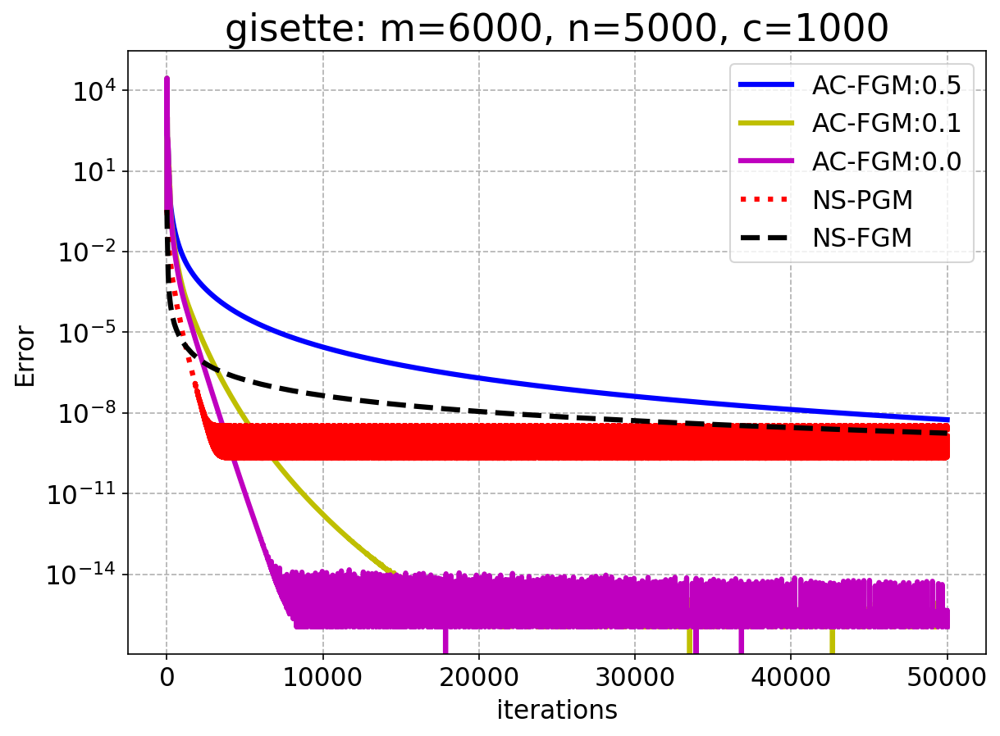

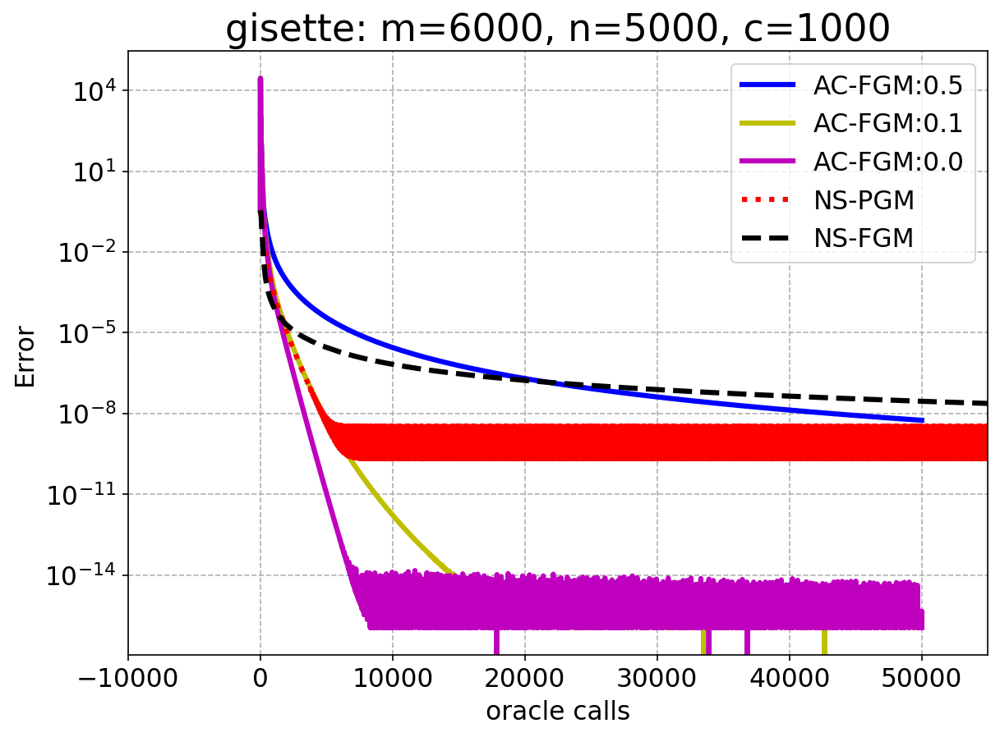

In [24]:
dataset = "gisette"
c = 1000
k = 50000
right_lim = 55000
title = "gisette: m=6000, n=5000, c=1000"

print("========================")
A_raw, b = fetch_libsvm(dataset)
A = A_raw * 1000
srl = Square_Root_Lasso(A, b, c)
print("gamma: %f"%srl.gamma)
fom = First_Order_Methods(srl)
print("initial function value: %f"%srl.objective(fom.x_0))
print("------------------------")
result_gisette_srl = fom.test_all_methods_nonsmooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('square_root_gisette_1000.pkl', 'wb') as f:  
    pickle.dump(result_gisette_srl, f)

gamma: 5.953269
initial function value: 1.000000
------------------------
AC-FGM: k=50000, alpha=0.000, beta=0.184, eps=1e-8
Done: 2973.285 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.100, beta=0.184, eps=1e-8
Done: 2956.065 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.500, beta=0.184, eps=1e-8
Done: 2974.788 seconds
-----------------------------------
NS-PGM: k=50000, eps=1e-8
Done: 6410.138 seconds
-----------------------------------
NS-FGM: k=50000, eps=1e-8
Done: 11071.814 seconds
-----------------------------------


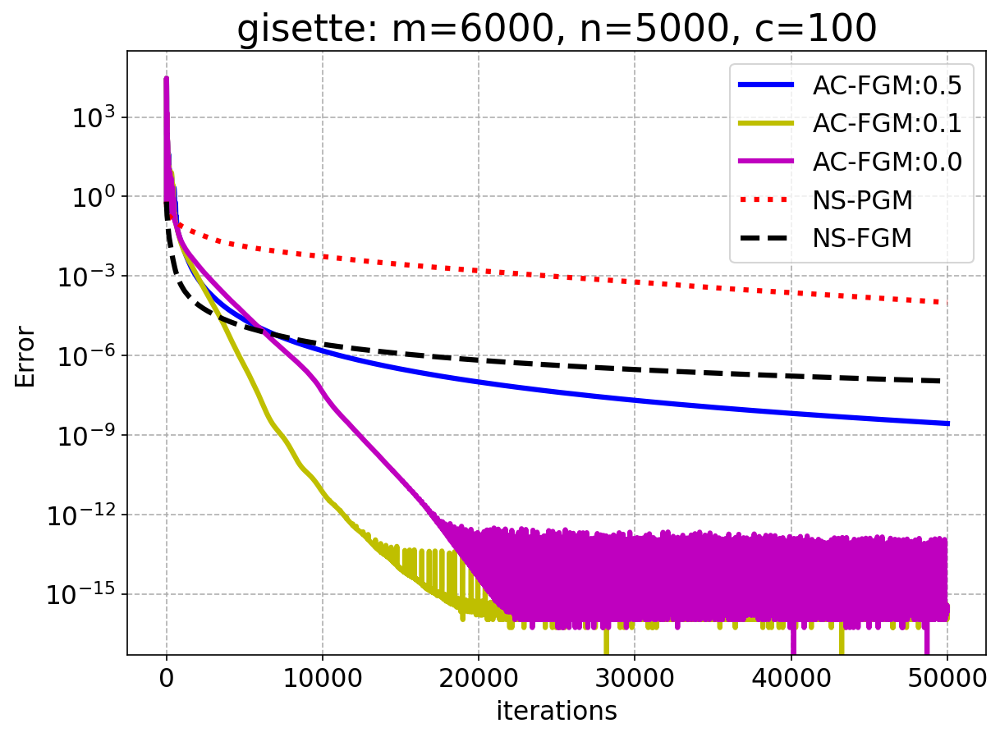

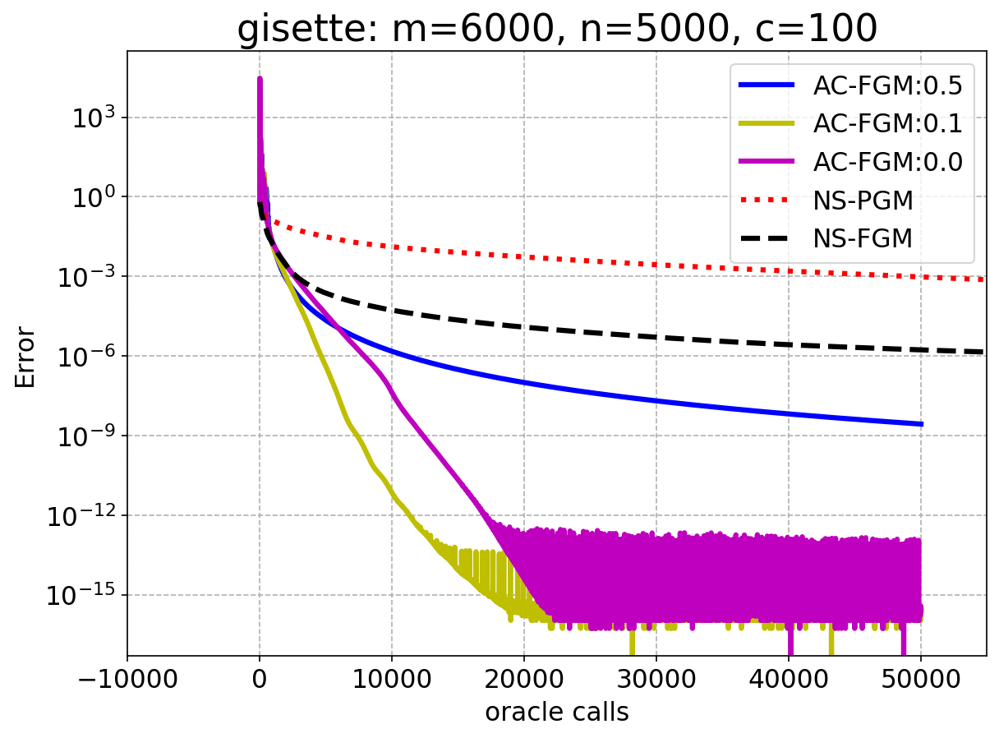

In [26]:
dataset = "gisette"
c = 100
k = 50000
right_lim = 55000
title = "gisette: m=6000, n=5000, c=100"

print("========================")
A_raw, b = fetch_libsvm(dataset)
A = A_raw * 1000
srl = Square_Root_Lasso(A, b, c)
print("gamma: %f"%srl.gamma)
fom = First_Order_Methods(srl)
print("initial function value: %f"%srl.objective(fom.x_0))
print("------------------------")
result_gisette_srl_2 = fom.test_all_methods_nonsmooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('square_root_gisette_100.pkl', 'wb') as f:  
    pickle.dump(result_gisette_srl_2, f)

# sparse logistic regression

In [2]:
dataset = "real-sim"
c = 0.005
k = 10000
right_lim = 11000
title = "real-sim: m=72309, n=20958, c=0.005"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))


gamma: 5.266744
initial function value: 50120.779479


In [3]:
results_FISTA = fom.FISTA(k=k, gamma=fom.prob.gamma)

FISTA: k=10000
1
139186.46796485392
1
51434.68797682451
1
12172.134670270007
Done: 1920.833 seconds
-----------------------------------


gamma: 5.266744
initial function value: 50120.779479
------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 889.665 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 905.199 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 907.266 seconds
-----------------------------------
AdaGD: k=10000
Number of calls used for the initial linesearch: 5
Done: 893.229 seconds
-----------------------------------
NS-FGM: k=10000
Done: 3358.331 seconds
-----------------------------------
FISTA: k=10000
Done: 1974.405 seconds
-----------------------------------


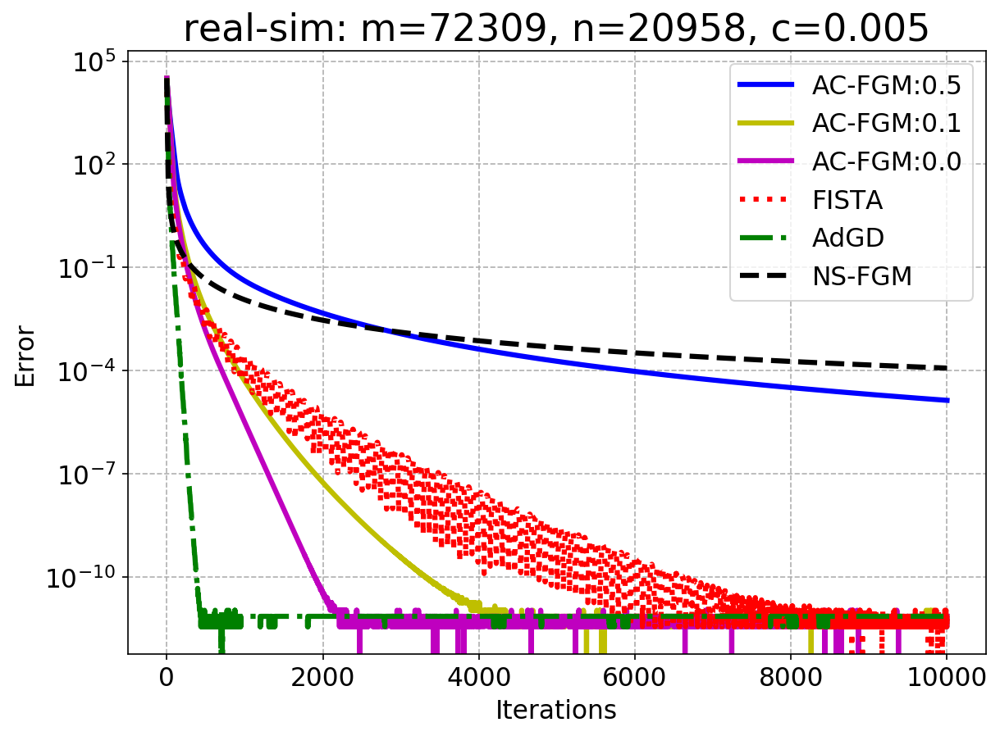

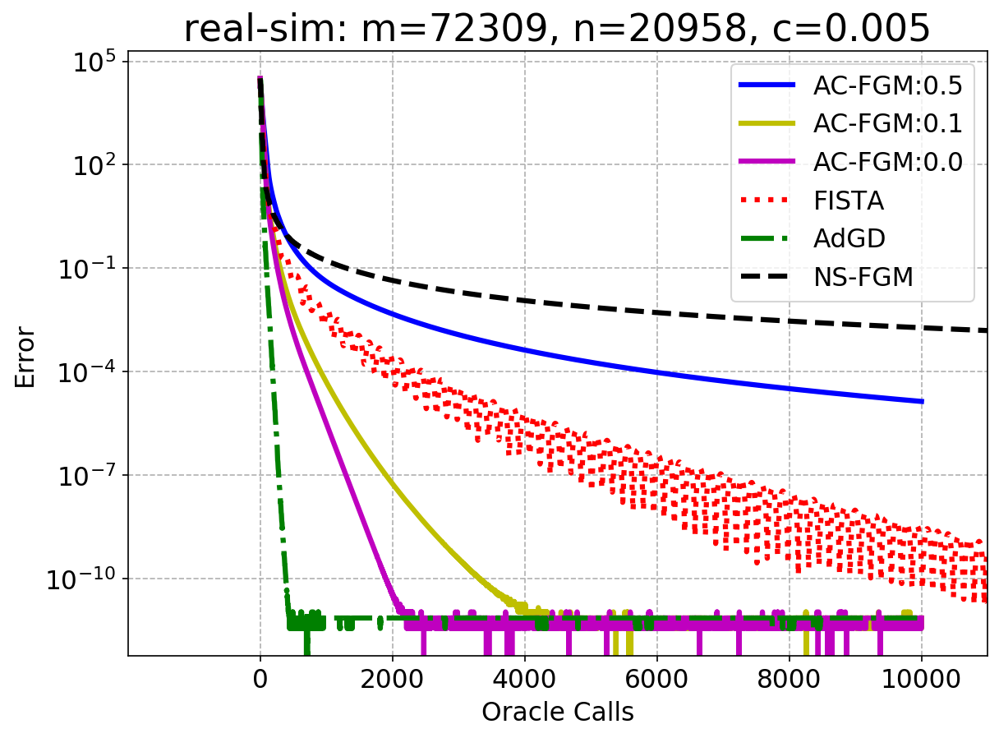

In [2]:
dataset = "real-sim"
c = 0.005
k = 10000
right_lim = 11000
title = "real-sim: m=72309, n=20958, c=0.005"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_sim_slr = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_realsim_005.pkl', 'wb') as f:  
    pickle.dump(result_real_sim_slr, f)

gamma: 1.053349
initial function value: 50120.779479
------------------------
AC-FGM: k=20000, alpha=0.000, beta=0.184
Done: 1757.469 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.100, beta=0.184
Done: 1874.061 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.500, beta=0.184
Done: 1839.844 seconds
-----------------------------------
AdaGD: k=20000
Number of calls used for the initial linesearch: 5
Done: 1779.788 seconds
-----------------------------------
NS-FGM: k=20000
Done: 6682.614 seconds
-----------------------------------
FISTA: k=20000
Done: 3884.854 seconds
-----------------------------------


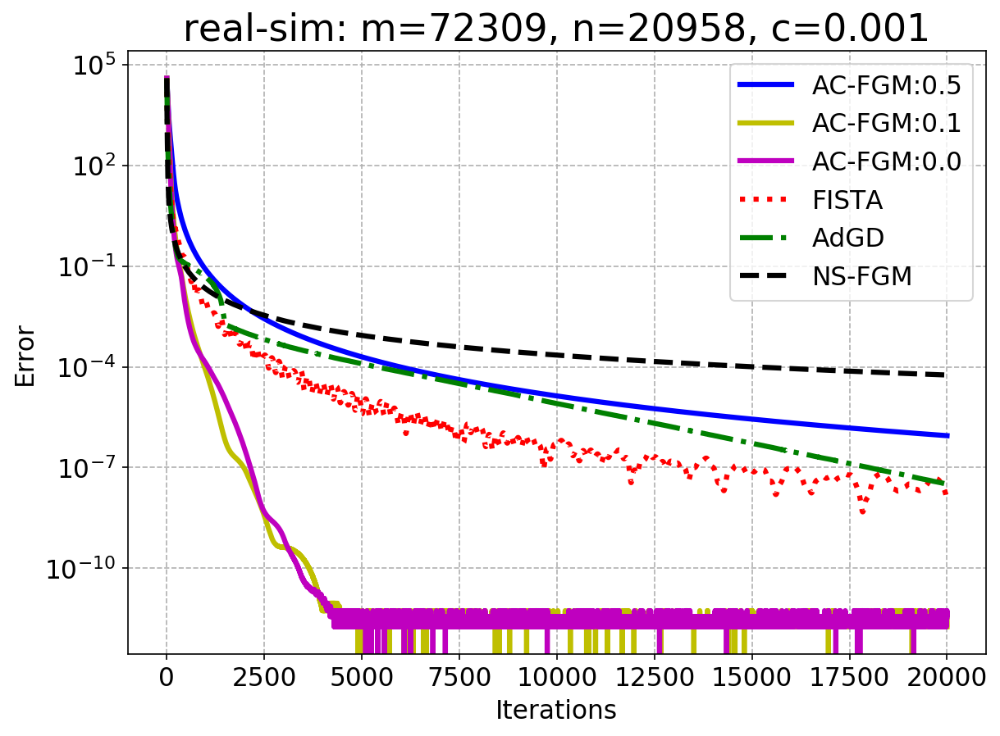

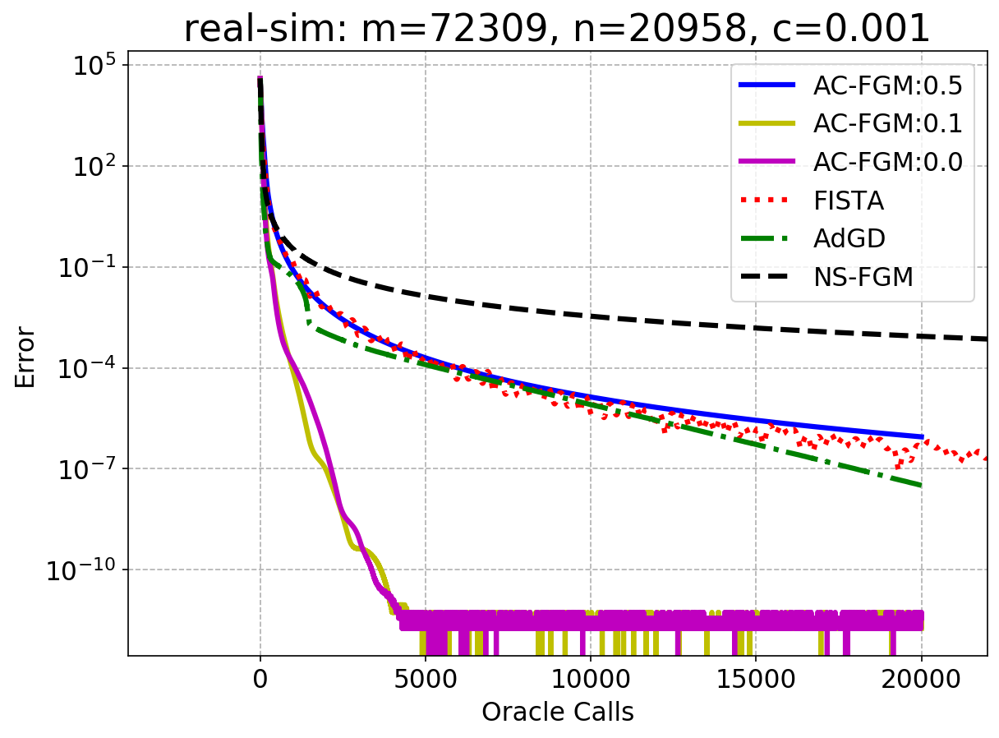

In [3]:
dataset = "real-sim"
c = 0.001
k = 20000
right_lim = 22000
title = "real-sim: m=72309, n=20958, c=0.001"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_sim_slr_2 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_realsim_001.pkl', 'wb') as f: 
    pickle.dump(result_real_sim_slr_2, f)

gamma: 1.321904
initial function value: 14030.685229
------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 379.121 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 379.245 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 379.283 seconds
-----------------------------------
AdaGD: k=10000
Number of calls used for the initial linesearch: 4
Done: 376.364 seconds
-----------------------------------
NS-FGM: k=10000
Done: 1333.054 seconds
-----------------------------------
FISTA: k=10000
Done: 739.689 seconds
-----------------------------------


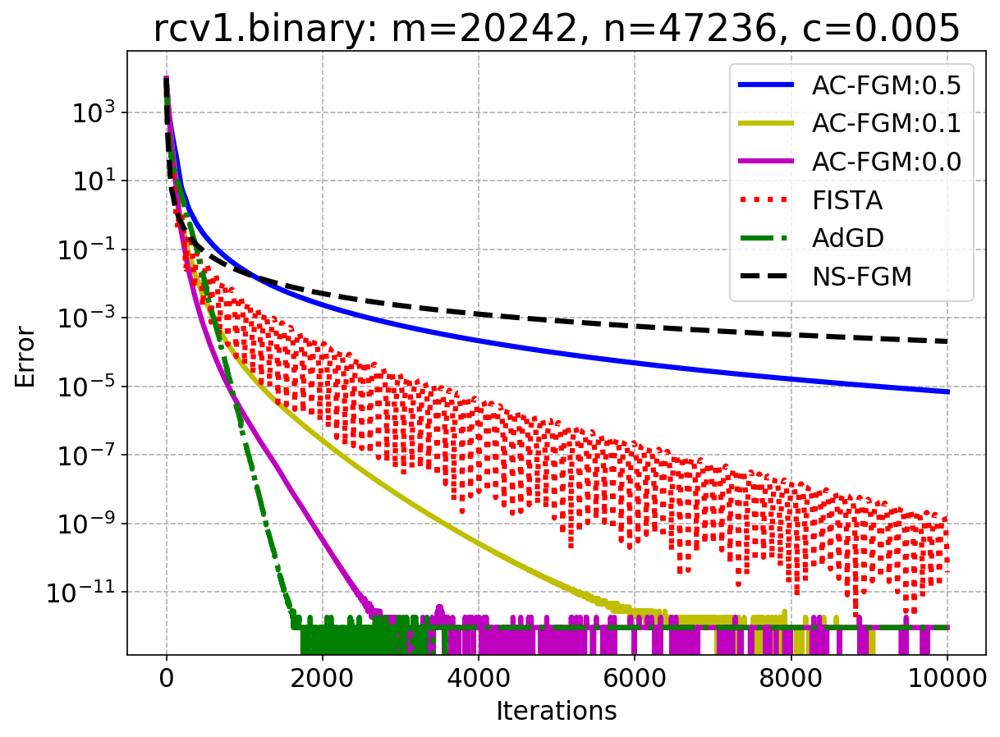

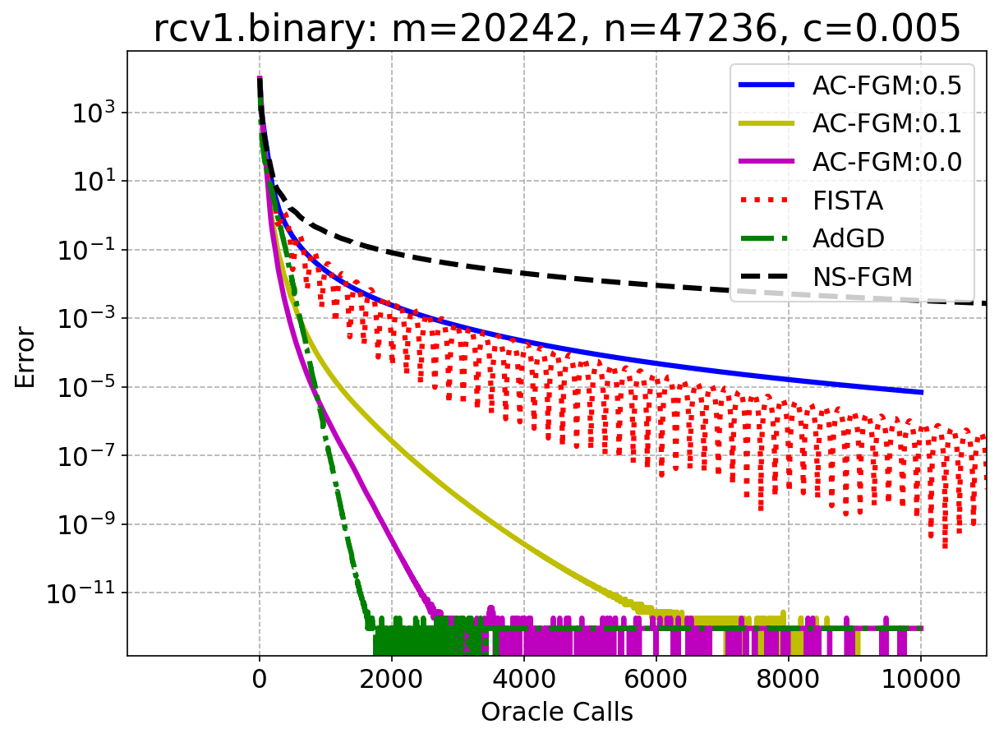

In [4]:
dataset = "rcv1.binary"
c = 0.005
k = 10000
right_lim = 11000
title = "rcv1.binary: m=20242, n=47236, c=0.005"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_rcv_slr = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_rcv_005.pkl', 'wb') as f:  
    pickle.dump(result_real_rcv_slr, f)

gamma: 0.264381
initial function value: 14030.685229
------------------------
AC-FGM: k=20000, alpha=0.000, beta=0.184
Done: 739.532 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.100, beta=0.184
Done: 762.011 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.500, beta=0.184
Done: 760.906 seconds
-----------------------------------
AdaGD: k=20000
Number of calls used for the initial linesearch: 4
Done: 748.179 seconds
-----------------------------------
NS-FGM: k=20000
Done: 2659.489 seconds
-----------------------------------
FISTA: k=20000
Done: 1464.585 seconds
-----------------------------------


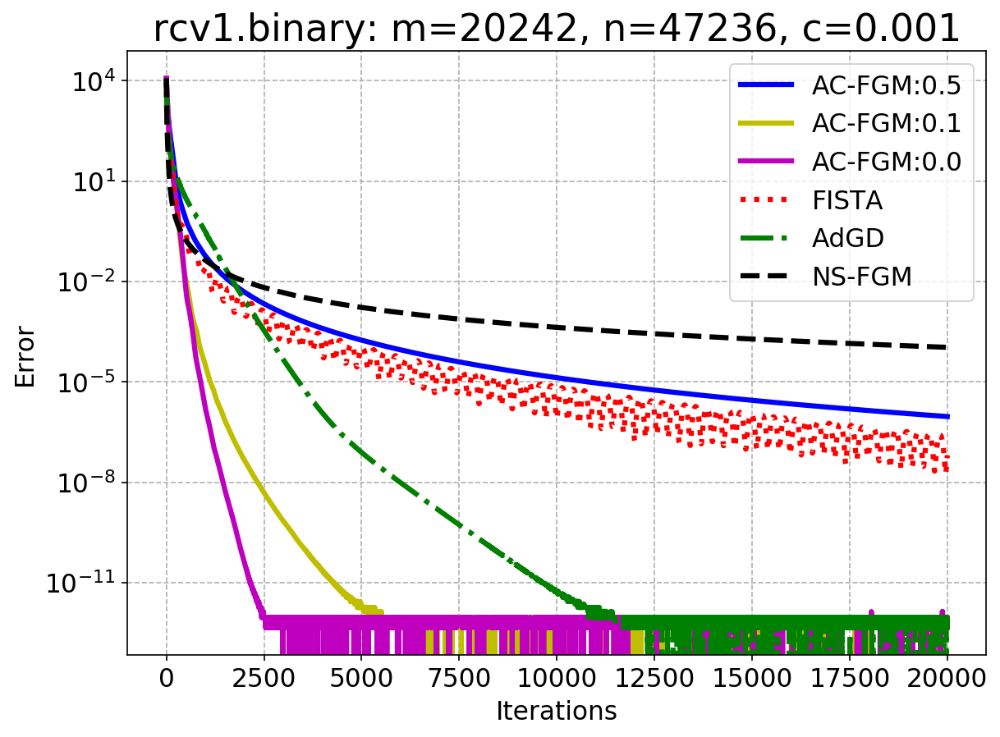

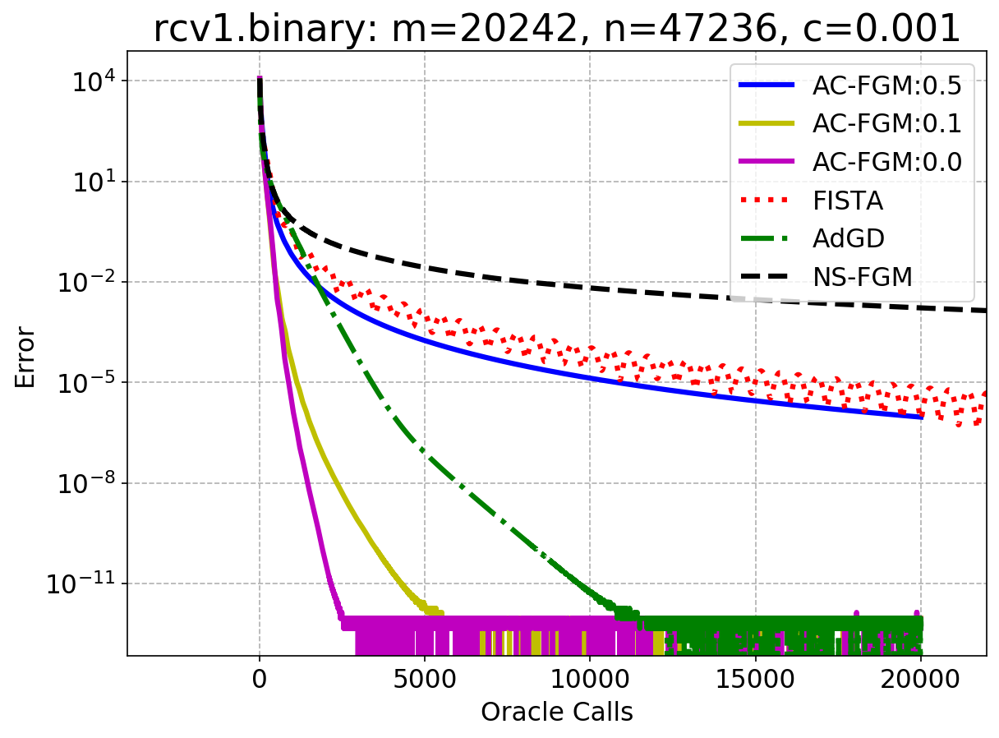

In [5]:
dataset = "rcv1.binary"
c = 0.001
k = 20000
right_lim = 22000
title = "rcv1.binary: m=20242, n=47236, c=0.001"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_rcv_slr_2 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_rcv_001.pkl', 'wb') as f: 
    pickle.dump(result_real_rcv_slr_2, f)

gamma: 18.670170
initial function value: 4158.883083
------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 539.424 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 542.054 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 540.708 seconds
-----------------------------------
AdaGD: k=10000
Number of calls used for the initial linesearch: 8
Done: 544.707 seconds
-----------------------------------
NS-FGM: k=10000
Done: 1725.667 seconds
-----------------------------------
FISTA: k=10000
Done: 967.863 seconds
-----------------------------------


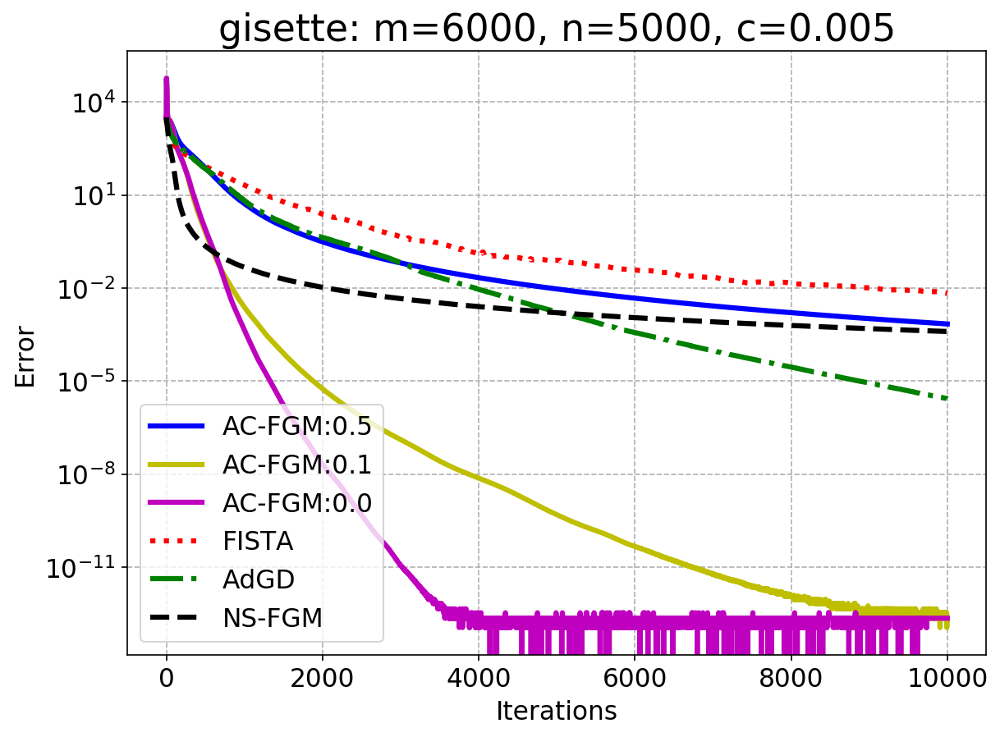

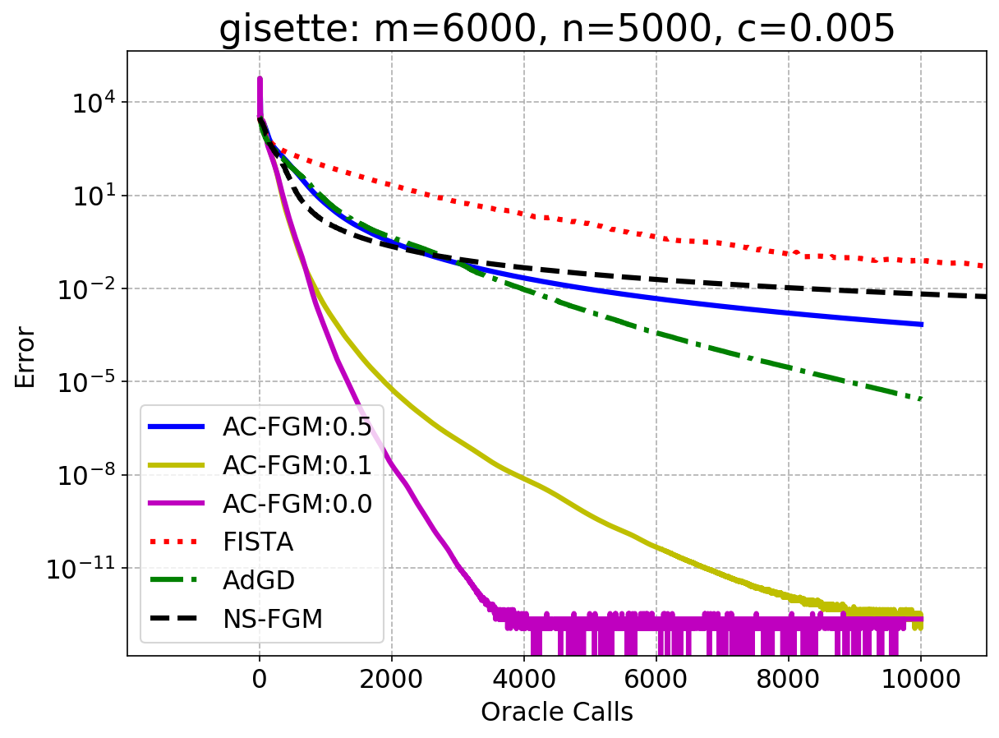

In [6]:
dataset = "gisette"
c = 0.005
k = 10000
right_lim = 11000
title = "gisette: m=6000, n=5000, c=0.005"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_gisette_slr = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_gisette_005.pkl', 'wb') as f: 
    pickle.dump(result_real_gisette_slr, f)

gamma: 3.734034
initial function value: 4158.883083
------------------------
AC-FGM: k=20000, alpha=0.000, beta=0.184
Done: 1081.756 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.100, beta=0.184
Done: 1093.605 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.500, beta=0.184
Done: 1115.406 seconds
-----------------------------------
AdaGD: k=20000
Number of calls used for the initial linesearch: 8
Done: 1120.620 seconds
-----------------------------------
NS-FGM: k=20000
Done: 3629.755 seconds
-----------------------------------
FISTA: k=20000
Done: 2019.921 seconds
-----------------------------------


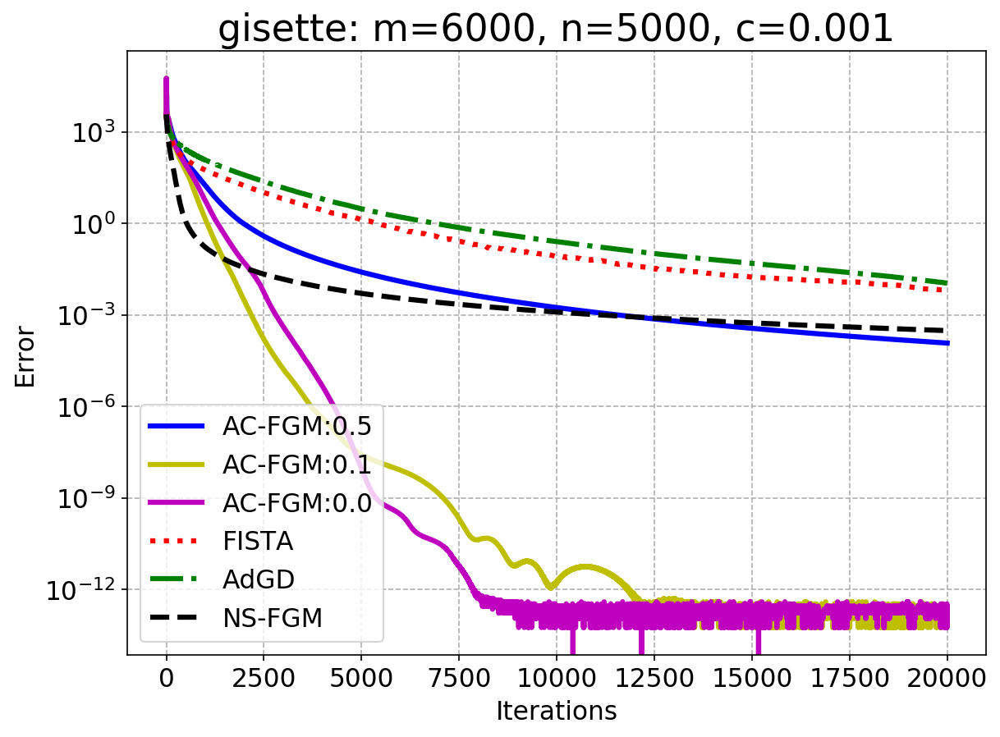

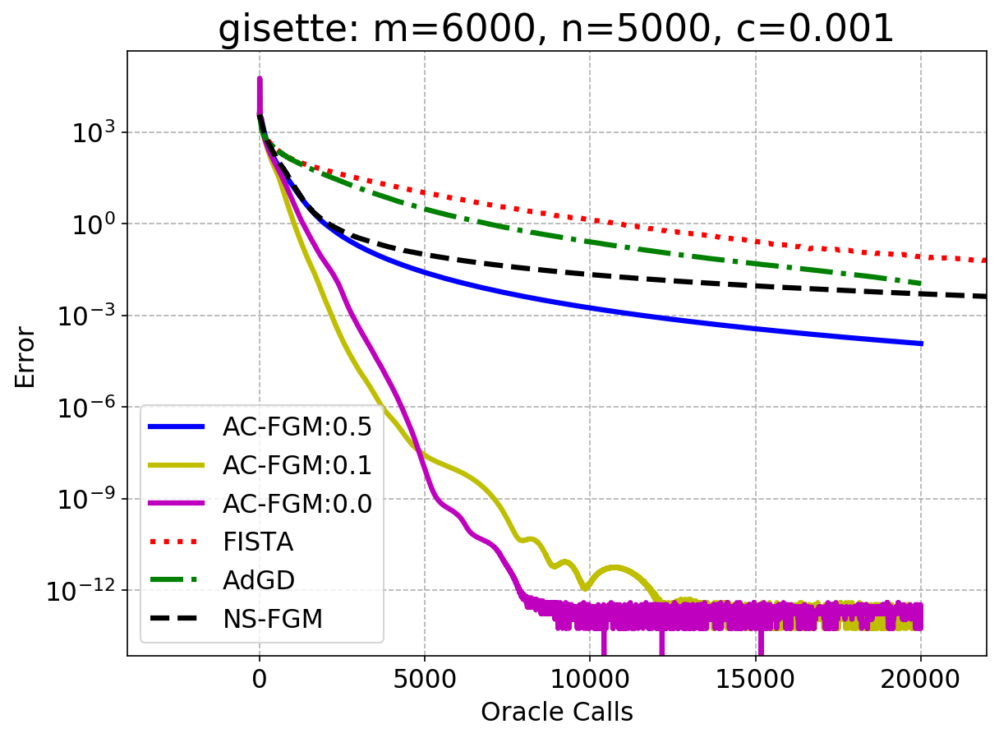

In [7]:
dataset = "gisette"
c = 0.001
k = 20000
right_lim = 22000
title = "gisette: m=6000, n=5000, c=0.001"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_gisette_slr_2 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_gisette_001.pkl', 'wb') as f: 
    pickle.dump(result_real_gisette_slr_2, f)

gamma: 87.605000
initial function value: 22569.565346
------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 24.441 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 24.069 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 23.737 seconds
-----------------------------------
AdaGD: k=10000
Number of calls used for the initial linesearch: 5
Done: 23.723 seconds
-----------------------------------
NS-FGM: k=10000
Done: 100.095 seconds
-----------------------------------
FISTA: k=10000
Done: 58.482 seconds
-----------------------------------


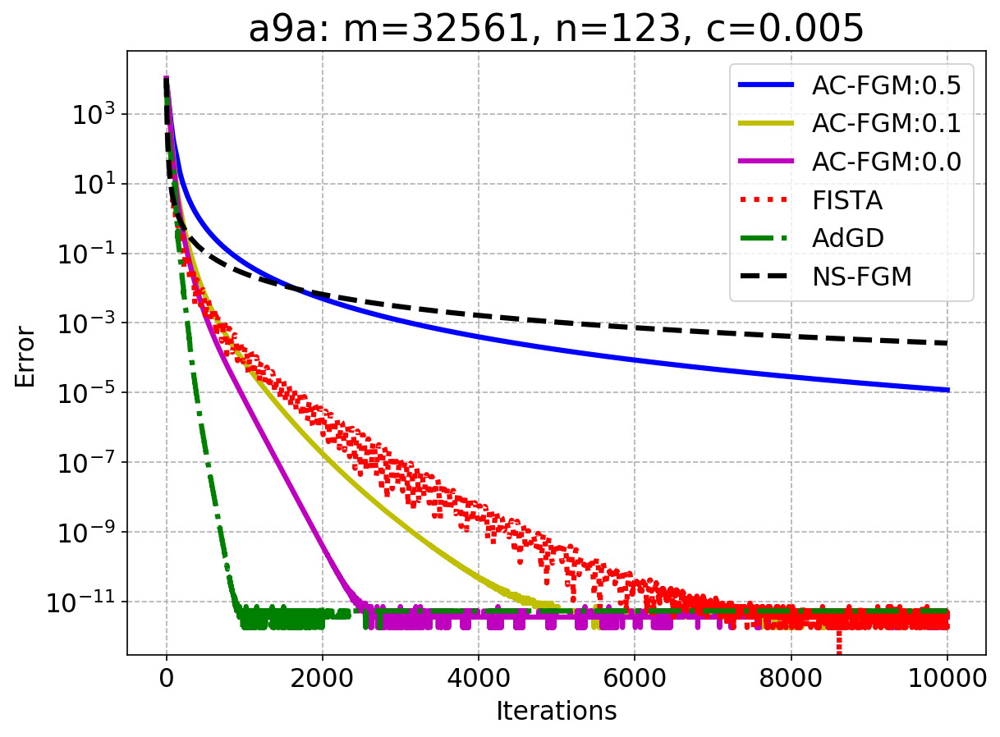

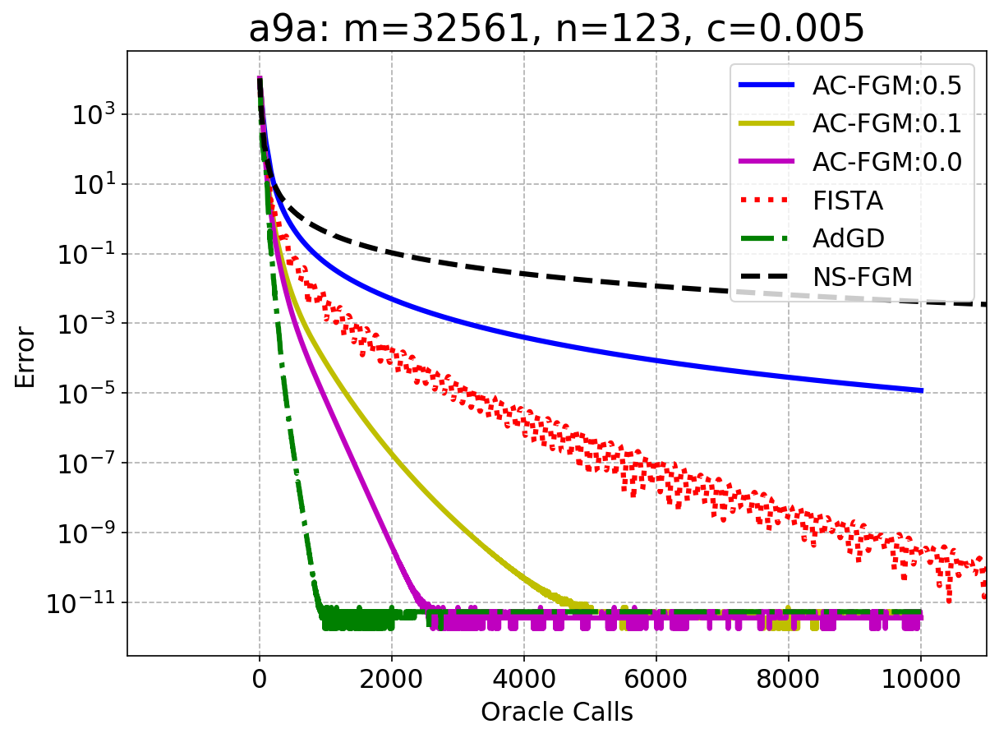

In [8]:
dataset = "a9a"
c = 0.005
k = 10000
right_lim = 11000
title = "a9a: m=32561, n=123, c=0.005"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_a9a_slr = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_a9a_005.pkl', 'wb') as f: 
    pickle.dump(result_real_a9a_slr, f)

gamma: 17.521000
initial function value: 22569.565346
------------------------
AC-FGM: k=20000, alpha=0.000, beta=0.184
Done: 47.113 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.100, beta=0.184
Done: 47.390 seconds
-----------------------------------
AC-FGM: k=20000, alpha=0.500, beta=0.184
Done: 47.219 seconds
-----------------------------------
AdaGD: k=20000
Number of calls used for the initial linesearch: 5
Done: 47.238 seconds
-----------------------------------
NS-FGM: k=20000
Done: 199.947 seconds
-----------------------------------
FISTA: k=20000
Done: 119.624 seconds
-----------------------------------


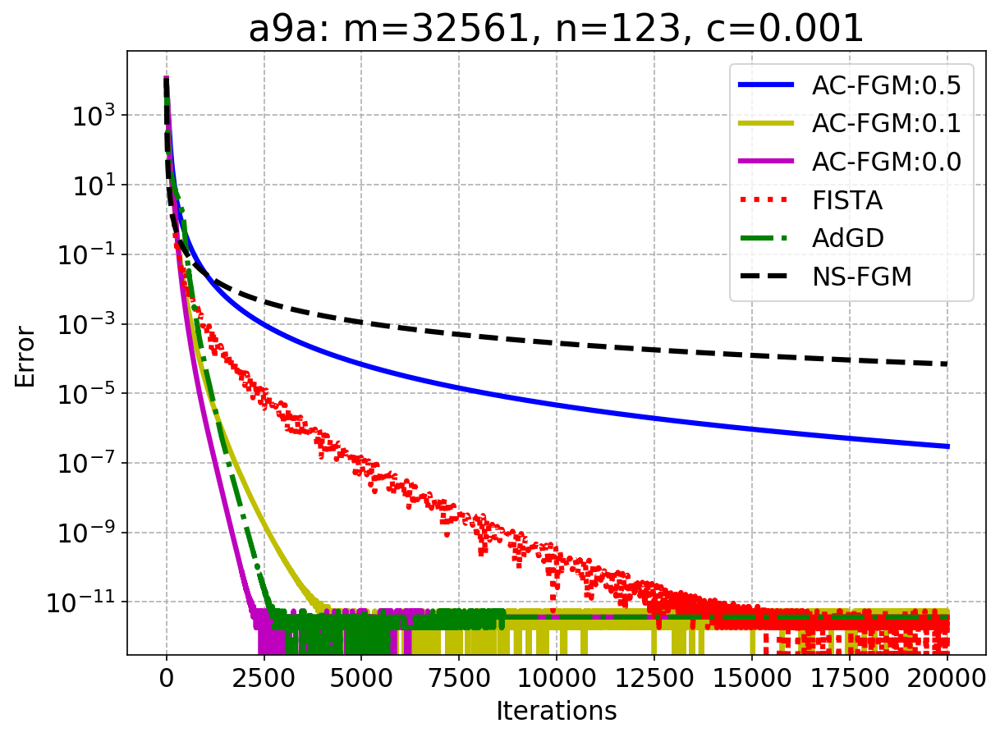

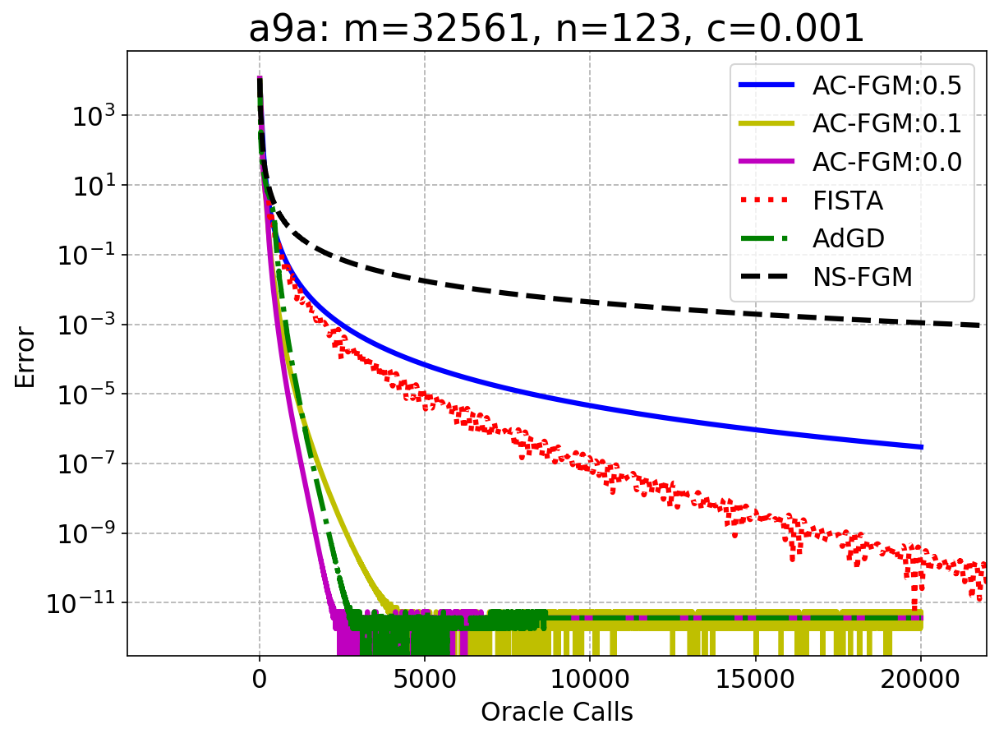

In [9]:
dataset = "a9a"
c = 0.001
k = 20000
right_lim = 22000
title = "a9a: m=32561, n=123, c=0.001"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_a9a_slr_2 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_a9a_001.pkl', 'wb') as f: 
    pickle.dump(result_real_a9a_slr_2, f)

gamma: 54.306363
initial function value: 402726.829671
------------------------
AC-FGM: k=30000, alpha=0.000, beta=0.184
Done: 1179.403 seconds
-----------------------------------
AC-FGM: k=30000, alpha=0.100, beta=0.184
Done: 1181.975 seconds
-----------------------------------
AC-FGM: k=30000, alpha=0.500, beta=0.184
Done: 1182.177 seconds
-----------------------------------
AdaGD: k=30000
Number of calls used for the initial linesearch: 1
Done: 1178.688 seconds
-----------------------------------
NS-FGM: k=30000
Done: 5058.469 seconds
-----------------------------------
FISTA: k=30000
Done: 2979.070 seconds
-----------------------------------


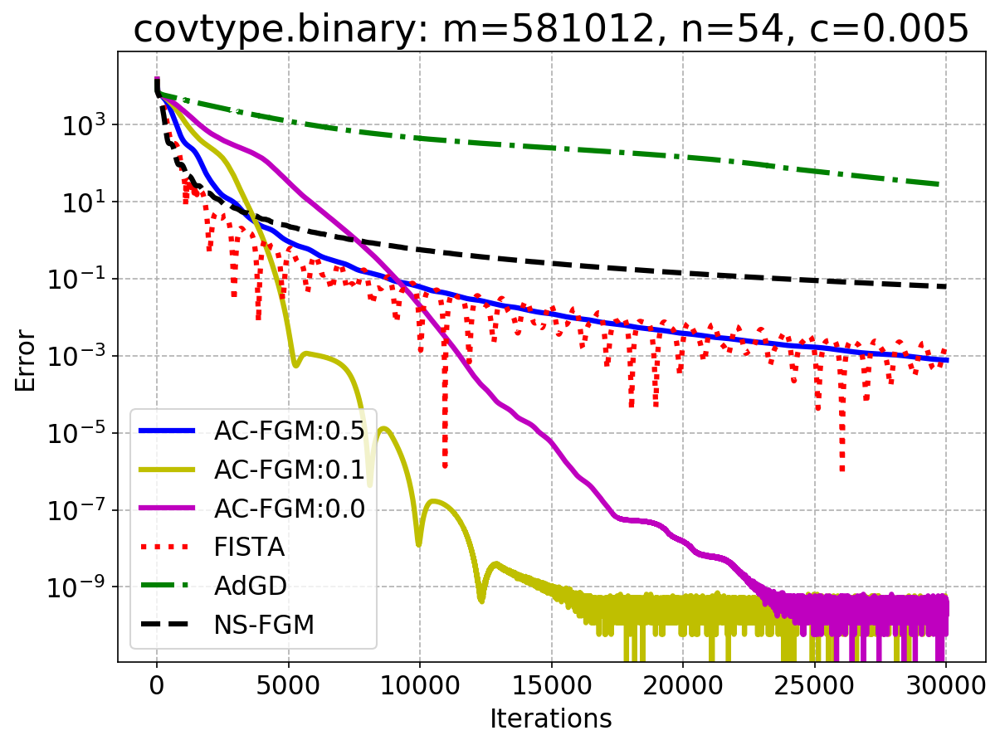

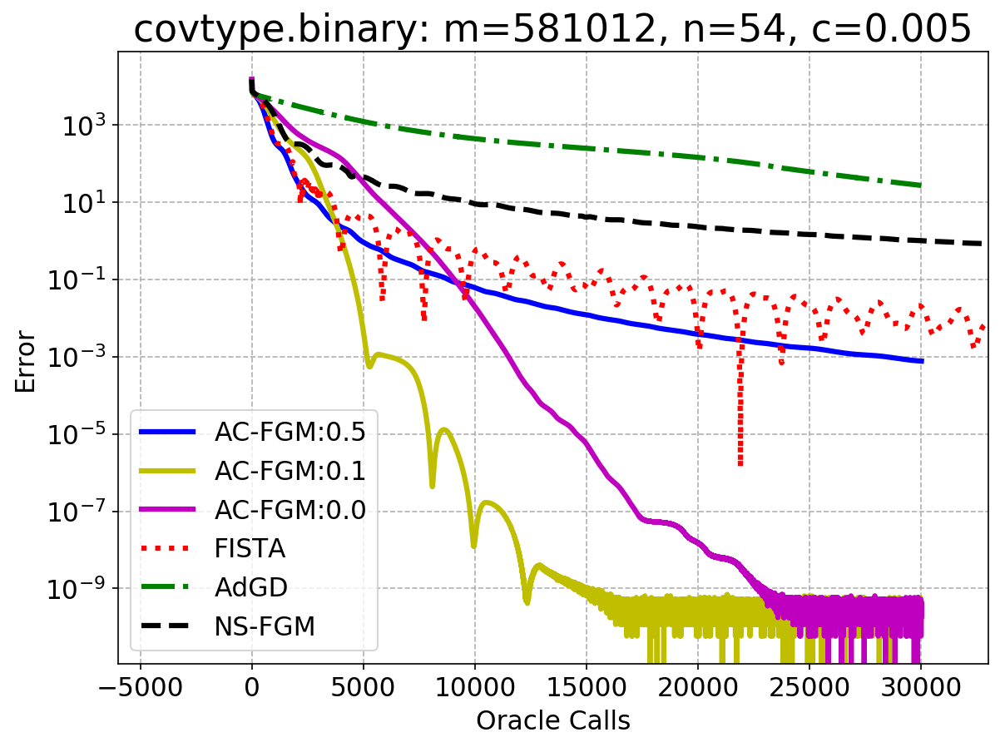

In [5]:
dataset = "covtype.binary"
c = 0.005
k = 30000
right_lim = 33000
title = "covtype.binary: m=581012, n=54, c=0.005"

print("========================")
A_raw, b_raw = fetch_libsvm(dataset)
b = (b_raw - 1.5) * 2
A = A_raw / np.max(A_raw)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_covtype_slr = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_covtype_005.pkl', 'wb') as f: 
    pickle.dump(result_real_covtype_slr, f)

gamma: 10.861273
initial function value: 402726.829671
------------------------
AC-FGM: k=40000, alpha=0.000, beta=0.184
Done: 1578.643 seconds
-----------------------------------
AC-FGM: k=40000, alpha=0.100, beta=0.184
Done: 1576.341 seconds
-----------------------------------
AC-FGM: k=40000, alpha=0.500, beta=0.184
Done: 1577.109 seconds
-----------------------------------
AdaGD: k=40000
Number of calls used for the initial linesearch: 1
Done: 1577.291 seconds
-----------------------------------
NS-FGM: k=40000
Done: 6758.692 seconds
-----------------------------------
FISTA: k=40000
Done: 3976.490 seconds
-----------------------------------


/Users/litianjiao/opt/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


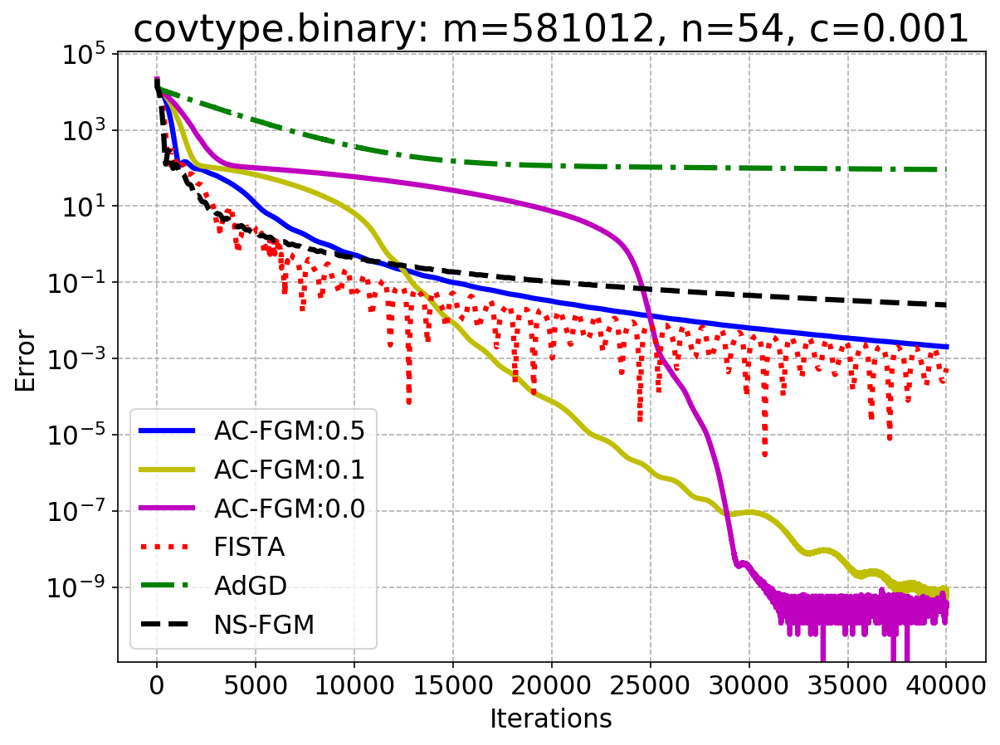

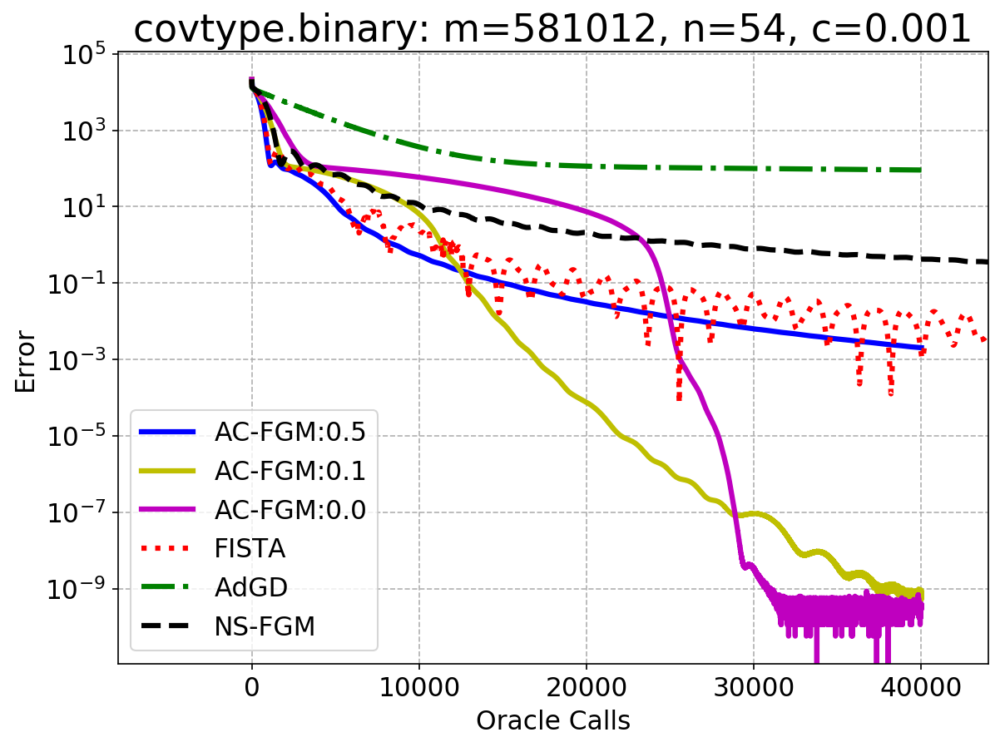

In [6]:
dataset = "covtype.binary"
c = 0.001
k = 40000
right_lim = 44000
title = "covtype.binary: m=581012, n=54, c=0.001"

print("========================")
A_raw, b_raw = fetch_libsvm(dataset)
b = (b_raw - 1.5) * 2
A = A_raw / np.max(A_raw)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_covtype_slr_2 = fom.test_all_methods_smooth(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_covtype_001.pkl', 'wb') as f: 
    pickle.dump(result_real_covtype_slr_2, f)

# Test initial line search

gamma: 0.000131
initial function value: 1.000000
AC-FGM: k=10000, alpha=0.000, beta=0.184
Number of calls used for the initial linesearch: 6
Done: 557.232 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Number of calls used for the initial linesearch: 6
Done: 558.353 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Number of calls used for the initial linesearch: 6
Done: 558.015 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 555.454 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 555.818 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 550.642 seconds
-----------------------------------


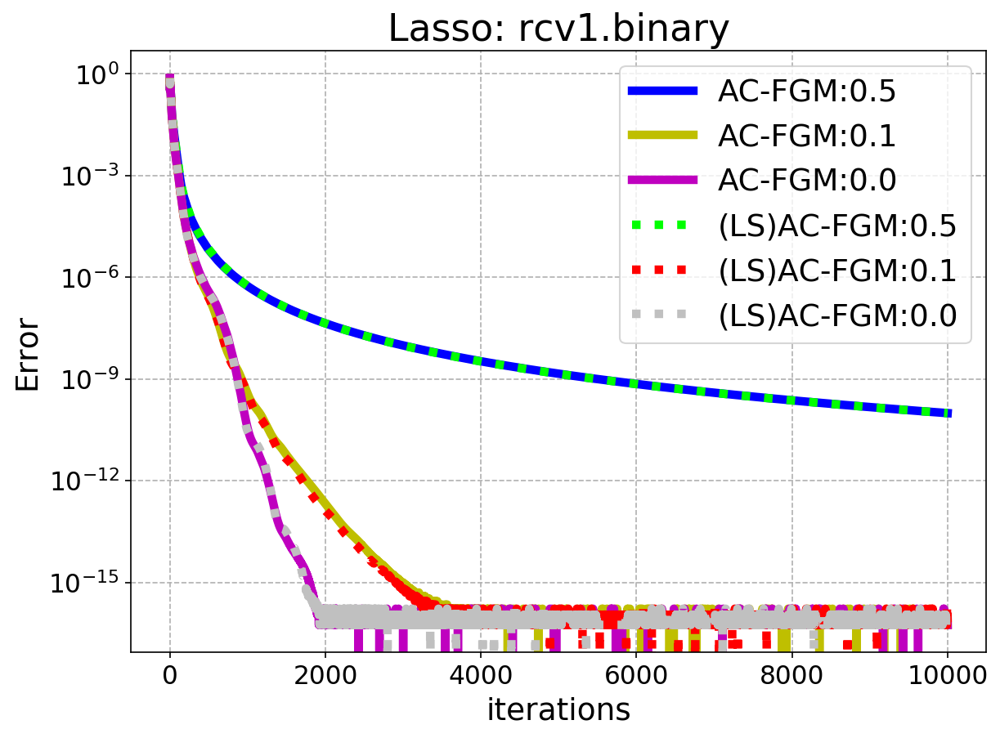

In [3]:
beta = 0.184
eps = 0
title = "Lasso: rcv1.binary"
dataset = "rcv1.binary"
c = 0.01
k = 10000
print("========================")
A, b = fetch_libsvm("rcv1.binary")
qwl = QP_with_Lasso(A, b, 0.01)
print("gamma: %f"%qwl.gamma)
fom = First_Order_Methods(qwl)
print("initial function value: %f"%qwl.objective(fom.x_0))

results_AC_FGM = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_01 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_02 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_01_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_02_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)

f_star = min([min(results_AC_FGM[0]), min(results_AC_FGM_01[0]), min(results_AC_FGM_02[0])])
plt.figure(figsize=(9,6.5),dpi=150)
plt.plot(results_AC_FGM_02_nl[0]-f_star, "b", linewidth=5)
plt.plot(results_AC_FGM_01_nl[0]-f_star, "y", linewidth=5)
plt.plot(results_AC_FGM_nl[0]-f_star, "m", linewidth=5)
plt.plot(results_AC_FGM_02[0]-f_star, ":", linewidth=5, color="lime")
plt.plot(results_AC_FGM_01[0]-f_star, ":r", linewidth=5)
plt.plot(results_AC_FGM[0]-f_star, ":", linewidth=5, color="silver")
plt.legend(["AC-FGM:0.5", "AC-FGM:0.1", "AC-FGM:0.0", "(LS)AC-FGM:0.5", "(LS)AC-FGM:0.1", "(LS)AC-FGM:0.0"], fontsize=18)
plt.yscale("log")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Error", fontsize=18)
plt.xlabel("iterations", fontsize=18)
plt.grid(linestyle= '--')
plt.title("%s"%(title), fontsize=22)
plt.show()

gamma: 16.249786
initial function value: 1998.525221
------------------------
AC-FGM: k=50000, alpha=0.000, beta=0.184, eps=1e-8
Number of calls used for the initial linesearch: 12


Done: 537.633 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.100, beta=0.184, eps=1e-8
Number of calls used for the initial linesearch: 12
Done: 537.428 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.500, beta=0.184, eps=1e-8
Number of calls used for the initial linesearch: 12
Done: 557.443 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.000, beta=0.184, eps=1e-8
Done: 561.282 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.100, beta=0.184, eps=1e-8
Done: 559.575 seconds
-----------------------------------
AC-FGM: k=50000, alpha=0.500, beta=0.184, eps=1e-8
Done: 565.460 seconds
-----------------------------------


/Users/litianjiao/opt/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


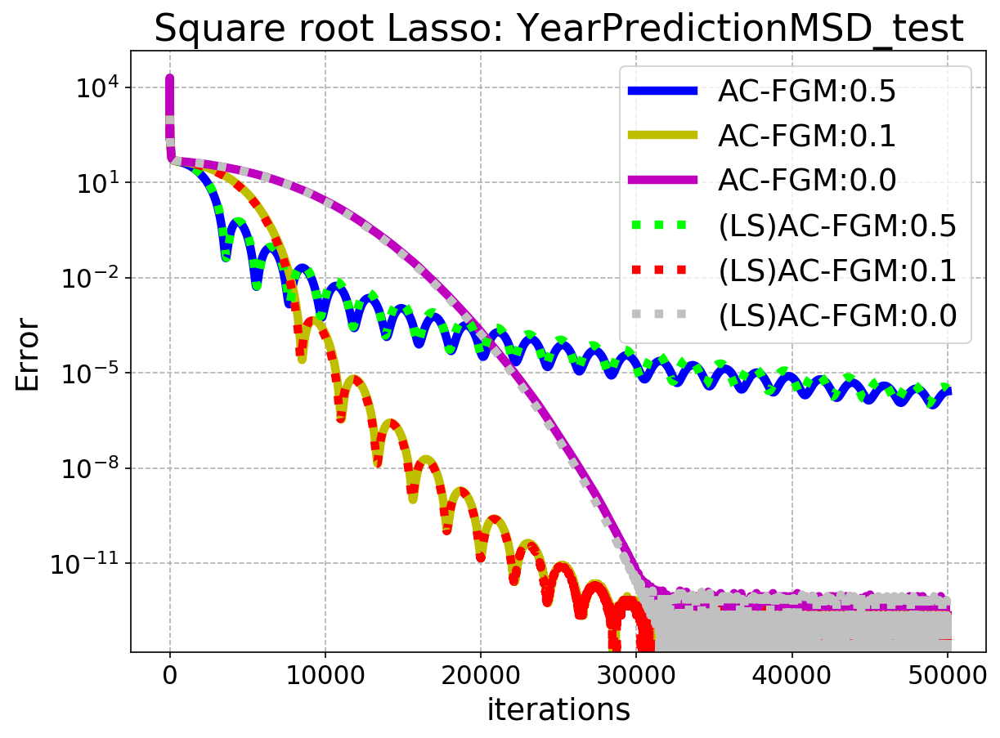

In [4]:
beta = 0.184
eps = 1e-8
title = "Square root Lasso: YearPredictionMSD_test"
dataset = "YearPredictionMSD_test"
c = 1000
k = 50000
print("========================")
A, b = fetch_libsvm(dataset)
srl = Square_Root_Lasso(A, b, c)
print("gamma: %f"%srl.gamma)
fom = First_Order_Methods(srl)
print("initial function value: %f"%srl.objective(fom.x_0))
print("------------------------")

results_AC_FGM = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_01 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_02 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_01_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_02_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)

f_star = min([min(results_AC_FGM[0]), min(results_AC_FGM_01[0]), min(results_AC_FGM_02[0])])
plt.figure(figsize=(9,6.5),dpi=150)
plt.plot(results_AC_FGM_02_nl[0]-f_star, "b", linewidth=5)
plt.plot(results_AC_FGM_01_nl[0]-f_star, "y", linewidth=5)
plt.plot(results_AC_FGM_nl[0]-f_star, "m", linewidth=5)
plt.plot(results_AC_FGM_02[0]-f_star, ":", linewidth=5, color="lime")
plt.plot(results_AC_FGM_01[0]-f_star, ":r", linewidth=5)
plt.plot(results_AC_FGM[0]-f_star, ":", linewidth=5, color="silver")
plt.legend(["AC-FGM:0.5", "AC-FGM:0.1", "AC-FGM:0.0", "(LS)AC-FGM:0.5", "(LS)AC-FGM:0.1", "(LS)AC-FGM:0.0"], fontsize=18)
plt.yscale("log")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Error", fontsize=18)
plt.xlabel("iterations", fontsize=18)
plt.grid(linestyle= '--')
plt.title("%s"%(title), fontsize=22)
plt.show()

gamma: 18.670170
initial function value: 4158.883083
AC-FGM: k=10000, alpha=0.000, beta=0.184
Number of calls used for the initial linesearch: 13
Done: 582.717 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Number of calls used for the initial linesearch: 13
Done: 613.404 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Number of calls used for the initial linesearch: 13
Done: 610.751 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 611.242 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 608.416 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 598.168 seconds
-----------------------------------


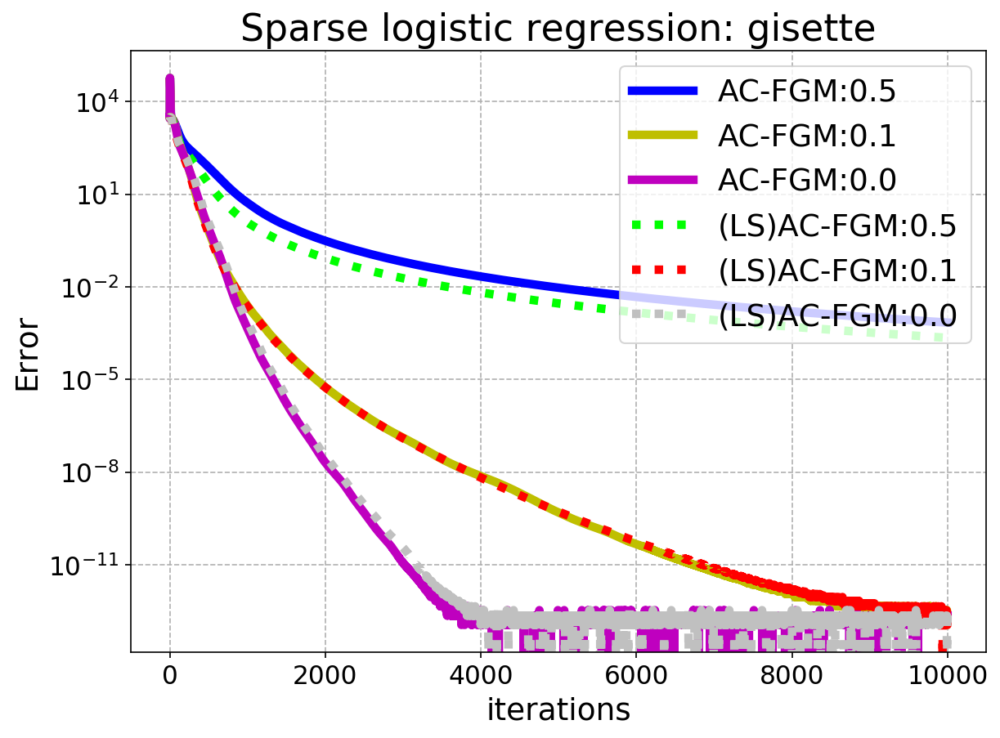

In [5]:
beta = 0.184
eps = 0
title = "Sparse logistic regression: gisette"
dataset = "gisette"
c = 0.005
k = 10000
print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))

results_AC_FGM = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_01 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_02 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_01_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_02_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)

f_star = min([min(results_AC_FGM[0]), min(results_AC_FGM_01[0]), min(results_AC_FGM_02[0])])
plt.figure(figsize=(9,6.5),dpi=150)
plt.plot(results_AC_FGM_02_nl[0]-f_star, "b", linewidth=5)
plt.plot(results_AC_FGM_01_nl[0]-f_star, "y", linewidth=5)
plt.plot(results_AC_FGM_nl[0]-f_star, "m", linewidth=5)
plt.plot(results_AC_FGM_02[0]-f_star, ":", linewidth=5, color="lime")
plt.plot(results_AC_FGM_01[0]-f_star, ":r", linewidth=5)
plt.plot(results_AC_FGM[0]-f_star, ":", linewidth=5, color="silver")
plt.legend(["AC-FGM:0.5", "AC-FGM:0.1", "AC-FGM:0.0", "(LS)AC-FGM:0.5", "(LS)AC-FGM:0.1", "(LS)AC-FGM:0.0"], fontsize=18)
plt.yscale("log")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Error", fontsize=18)
plt.xlabel("iterations", fontsize=18)
plt.grid(linestyle= '--')
plt.title("%s"%(title), fontsize=22)
plt.show()

gamma: 5.266744
initial function value: 50120.779479
AC-FGM: k=10000, alpha=0.000, beta=0.184
Number of calls used for the initial linesearch: 7
Done: 958.395 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Number of calls used for the initial linesearch: 7
Done: 954.460 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Number of calls used for the initial linesearch: 7
Done: 921.095 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.000, beta=0.184
Done: 853.502 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 848.870 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.500, beta=0.184
Done: 848.942 seconds
-----------------------------------


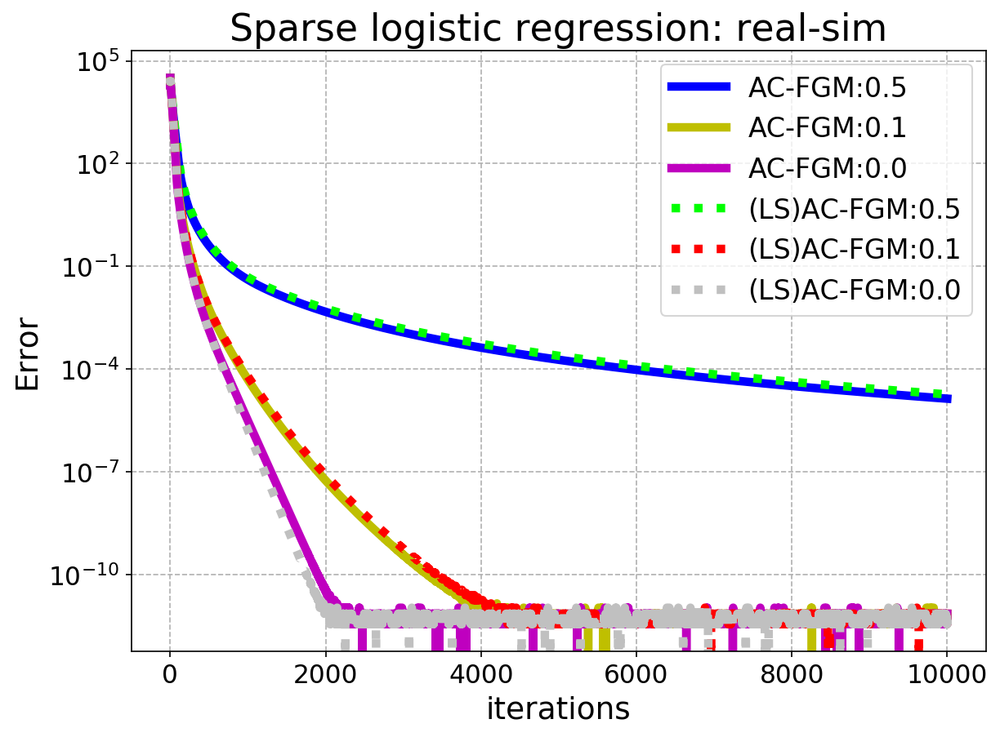

In [6]:
dataset = "real-sim"
c = 0.005
k = 10000
right_lim = 11000
title = "Sparse logistic regression: real-sim"
print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))

results_AC_FGM = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_01 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_02 = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma)
results_AC_FGM_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.0, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_01_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.1, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)
results_AC_FGM_02_nl = fom.universal_AC_FGM(k=k, beta = beta, alpha=0.5, eps=eps, gamma=fom.prob.gamma, initial_line_search=False)

f_star = min([min(results_AC_FGM[0]), min(results_AC_FGM_01[0]), min(results_AC_FGM_02[0])])
plt.figure(figsize=(9,6.5),dpi=150)
plt.plot(results_AC_FGM_02_nl[0]-f_star, "b", linewidth=5)
plt.plot(results_AC_FGM_01_nl[0]-f_star, "y", linewidth=5)
plt.plot(results_AC_FGM_nl[0]-f_star, "m", linewidth=5)
plt.plot(results_AC_FGM_02[0]-f_star, ":", linewidth=5, color="lime")
plt.plot(results_AC_FGM_01[0]-f_star, ":r", linewidth=5)
plt.plot(results_AC_FGM[0]-f_star, ":", linewidth=5, color="silver")
plt.legend(["AC-FGM:0.5", "AC-FGM:0.1", "AC-FGM:0.0", "(LS)AC-FGM:0.5", "(LS)AC-FGM:0.1", "(LS)AC-FGM:0.0"], fontsize=16)
plt.yscale("log")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Error", fontsize=18)
plt.xlabel("iterations", fontsize=18)
plt.grid(linestyle= '--')
plt.title("%s"%(title), fontsize=22)
plt.show()

# Adaptive Restart

splice: m=1000, n=60, c=0.005
gamma: 3.040000
initial function value: 693.147181
------------------------
AC-FGM: k=5000, alpha=0.100, beta=0.184
Done: 4.847 seconds
-----------------------------------
FISTA: k=5000
Done: 7.447 seconds
-----------------------------------
FISTA: k=5000
Done: 7.314 seconds
-----------------------------------
AC-FGM: k=5000, alpha=0.100, beta=0.184
Done: 4.760 seconds
-----------------------------------


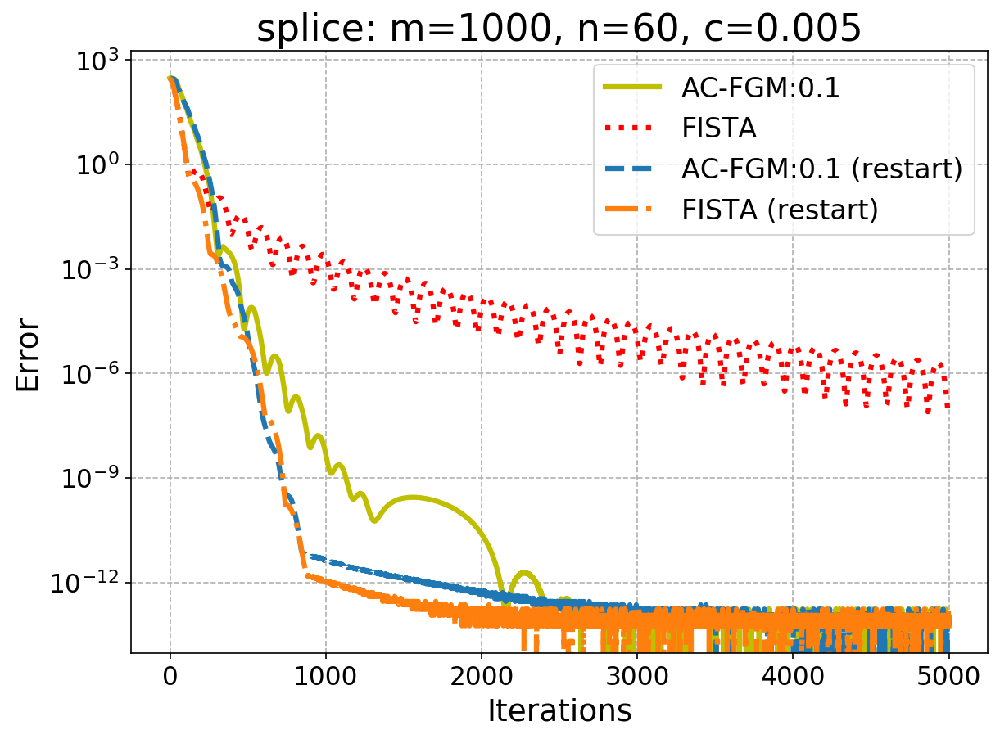

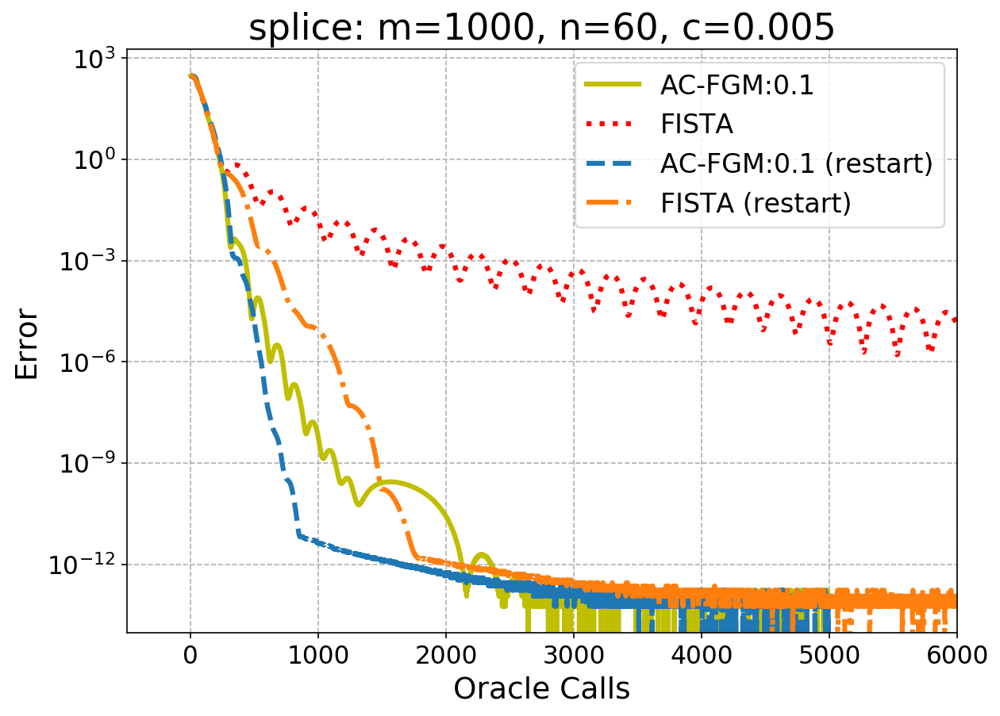

In [7]:
dataset = "splice"
c = 0.005
k = 5000
right_lim = 6000

print("========================")
A, b = fetch_libsvm(dataset)
title = dataset + ": m=%d, n=%d, c=%.3f"%(A.shape[0], A.shape[1], c)
print(title)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_slr = fom.test_all_methods_smooth_adaptive_restart(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_%s_%.3f_restart.pkl'%(dataset, c), 'wb') as f: 
    pickle.dump(result_slr, f)

gamma: 18.670170
initial function value: 4158.883083
------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 616.743 seconds
-----------------------------------
FISTA: k=10000
Done: 1110.964 seconds
-----------------------------------
FISTA: k=10000
Done: 1109.537 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 609.915 seconds
-----------------------------------


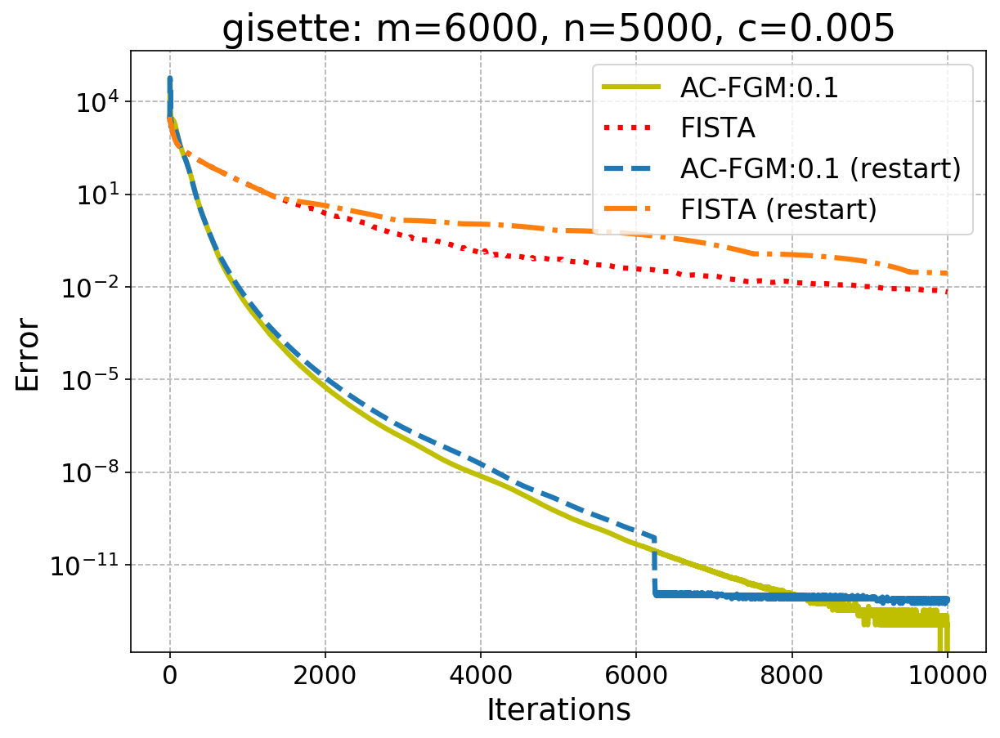

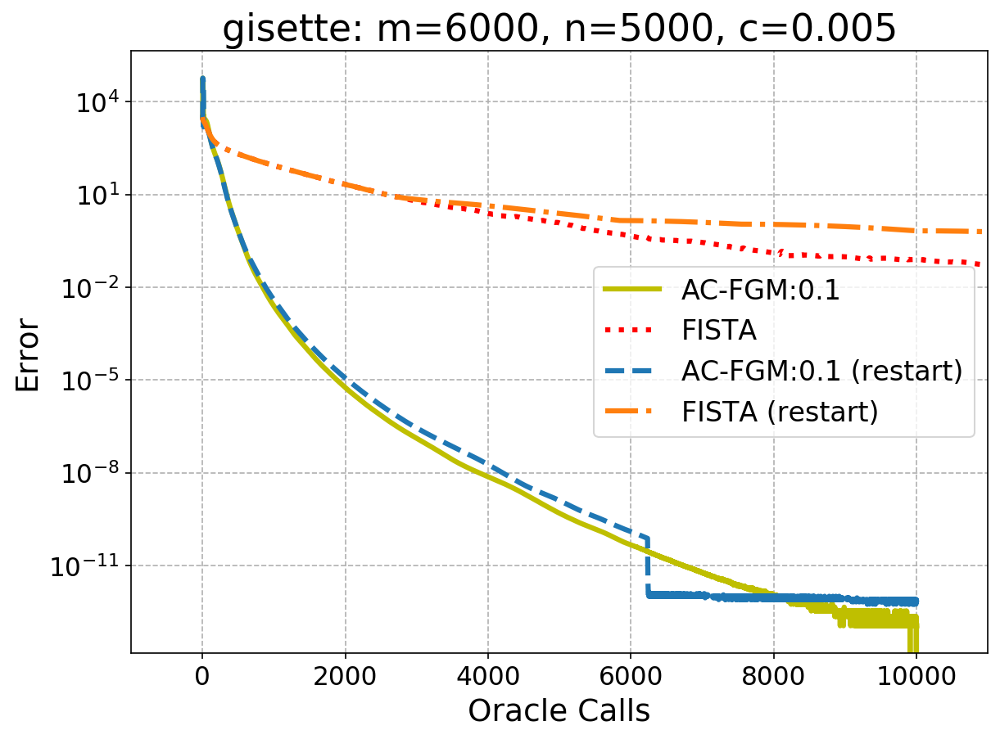

In [8]:
dataset = "gisette"
c = 0.005
k = 10000
right_lim = 11000
title = "gisette: m=6000, n=5000, c=0.005"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_gisette_slr = fom.test_all_methods_smooth_adaptive_restart(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_gisette_005_restart.pkl', 'wb') as f: 
    pickle.dump(result_real_gisette_slr, f)

gamma: 5.266744
initial function value: 50120.779479
------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 857.104 seconds
-----------------------------------
FISTA: k=10000
Done: 1876.437 seconds
-----------------------------------
FISTA: k=10000
Done: 1873.629 seconds
-----------------------------------
AC-FGM: k=10000, alpha=0.100, beta=0.184
Done: 855.098 seconds
-----------------------------------


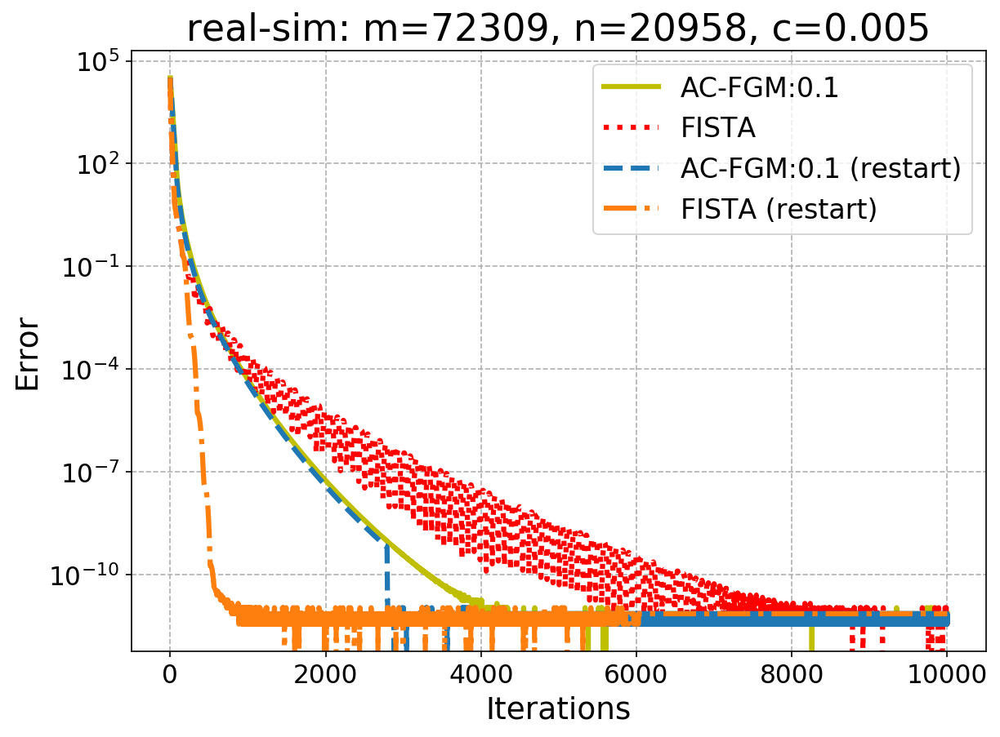

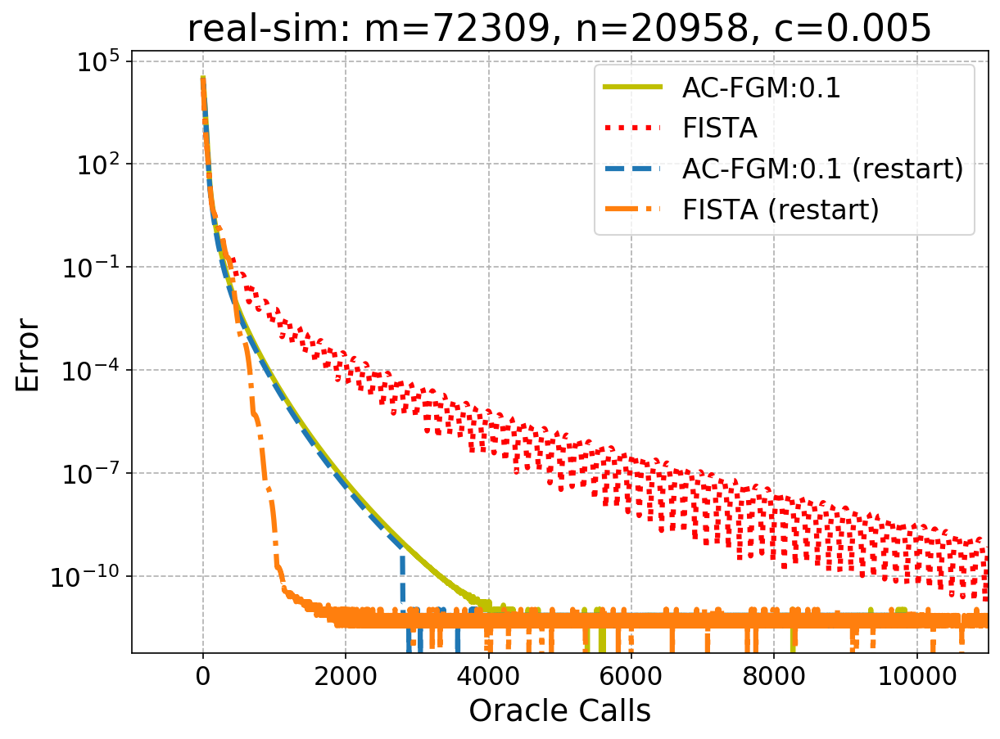

In [9]:
dataset = "real-sim"
c = 0.005
k = 10000
right_lim = 11000
title = "real-sim: m=72309, n=20958, c=0.005"

print("========================")
A, b = fetch_libsvm(dataset)
slr = Sparse_Logistic_Regression(A, b, c)
print("gamma: %f"%slr.gamma)
fom = First_Order_Methods(slr)
print("initial function value: %f"%slr.objective(fom.x_0))
print("------------------------")
result_real_sim_slr = fom.test_all_methods_smooth_adaptive_restart(k=k, beta=0.184, draw_performance_plot=True, dataset=title, initial_line_search=False, right_lim=right_lim)
with open('logistic_realsim_005_restart.pkl', 'wb') as f:  
    pickle.dump(result_real_sim_slr, f)